# Boxplot of continuous p65 stimulation. Compare median p65 protein signal in nucleus, nuclear membrane, cytosol

In [1]:
import numpy as np
import pandas as pd
import time
import os
import sys
from tqdm import tqdm, trange
from datetime import date
import nd2reader
from joblib import Parallel, delayed
import tifffile as tf
import xml.etree.ElementTree as ET
import napari
import skimage
from skimage.io import imread
from skimage.measure import block_reduce
from skimage.filters import try_all_threshold
import dask.array as da
import dask.dataframe as dd
from dask.diagnostics import ProgressBar
# from dask_ml.preprocessing import MinMaxScaler
import dask
import matplotlib
import matplotlib.pyplot as plt
import nd2
from skimage import exposure, restoration
from joblib import Parallel, delayed
import torch
from cellpose import models, core, plot
import cv2
import scipy
import seaborn as sns
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime
from skimage.morphology import closing, square
from skimage.measure import label
import scanpy as sc
import anndata
from anndata import AnnData
from pathlib import Path
from statannot import add_stat_annotation

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi = 300)

# sns.set(font_scale = 1.5)
sns.set_style('whitegrid')
np.random.seed(0)

c:\Users\nzhang326\AppData\Local\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# directories and inputs

In [2]:
# drugs vs control
dataPath = Path.cwd().parent / 'data'
assert dataPath.exists()

# folder to save graph screenshots
screenshotSavePath = Path.cwd().parent / 'figures'
assert screenshotSavePath.exists()

# identifier columns
idCols = ['Z', 'Y', 'X', 'CellLabel', 'CellRegion', 'Stim', 'FOV', 
          'MaskCytoLabel', 'MaskNucLabel', 'MaskNucMembLabel', 
          'NucCount', 'Cycle', 'NucCytoRatio', 'TimeStamp', 'Drug', 'AntiCorr']

# Read single cell data

In [3]:
dfCell = pd.read_hdf(dataPath / '02_boxplot_stim.h5',
                     key = 'df')
dfCell

,CellLabel,CellRegion,Stim,FOV,DAPI,H2B,p65 Protein,p65 RNA Dots,p65 RNA Intensity,GAPDH RNA Dots,GAPDH RNA Intensity,A20 Protein,Segmentation Abs,IKBa Protein,NucCytoRatio,Drug,TimeStamp
0,1,Cytosol,Non Responding,1,493.5,100.0,142.5,0.0,3132.0,0.0,3736.0,50.0,229.0,22.0,0.947735,TNFa,0
30,1,Nuclear Membrane,Non Responding,1,1139.0,152.0,140.0,0.0,200453.0,0.0,211020.0,52.0,215.0,23.0,0.947735,TNFa,0
60,1,Nucleus,Non Responding,1,1269.0,176.0,135.0,0.0,164460.0,0.0,170519.0,55.0,205.0,24.0,0.947735,TNFa,0
90,3,Cytosol,Partially Responding,1,554.0,126.0,167.0,0.0,70634.0,0.0,75421.0,74.0,242.0,24.0,1.005952,TNFa,0
120,3,Nuclear Membrane,Partially Responding,1,1051.0,184.0,169.0,0.0,276665.0,0.0,287436.0,70.0,227.0,24.0,1.005952,TNFa,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3030,61902,Nuclear Membrane,Fully Responding,480,448.0,250.0,174.0,13.0,312680.0,14.0,456352.0,39.0,56.0,16.0,1.458015,Unstimulated Baseline,105
3060,61902,Nucleus,Fully Responding,480,803.5,432.0,190.0,3.0,277759.0,12.0,515237.0,64.0,52.0,17.0,1.458015,Unstimulated Baseline,105
3090,61910,Cytosol,Partially Responding,480,220.0,185.0,163.0,6.0,109812.0,10.0,142022.0,29.0,60.0,15.0,1.109756,Unstimulated Baseline,105
3120,61910,Nuclear Membrane,Partially Responding,480,381.0,322.0,184.0,20.0,412911.0,25.0,626418.0,35.0,58.0,15.0,1.109756,Unstimulated Baseline,105


In [4]:
dfCell.groupby(['Drug']).agg({'CellLabel': 'nunique'}) # number of cells per drug

,CellLabel
Drug,
IL1B,28458
TNFa,29319
Unstimulated Baseline,19029


In [5]:
dfCell.describe()

,CellLabel,FOV,DAPI,H2B,p65 Protein,p65 RNA Dots,p65 RNA Intensity,GAPDH RNA Dots,GAPDH RNA Intensity,A20 Protein,Segmentation Abs,IKBa Protein,NucCytoRatio,TimeStamp
count,258542.000000,258542.000000,258542.000000,258542.000000,258542.000000,258542.000000,2.585420e+05,258542.000000,2.585420e+05,258542.000000,258542.000000,258542.000000,258542.000000,258542.000000
mean,25475.990385,203.428959,806.273874,294.954361,206.740491,5.983051,1.189869e+06,5.872802,1.718353e+06,46.201869,226.707243,44.062934,12.659073,61.179267
std,18513.765233,132.384795,505.588414,158.667882,93.324537,18.802151,2.964630e+06,18.636737,5.099256e+06,23.338918,195.388208,31.720080,51.903309,36.261051
min,0.000000,1.000000,30.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,3.000000,0.000000,0.000000,0.000485,0.000000
25%,8872.000000,88.000000,457.000000,183.000000,152.000000,0.000000,8.471600e+04,0.000000,1.019915e+05,32.000000,152.000000,23.000000,0.861111,45.000000
50%,23374.000000,195.000000,704.000000,270.000000,196.000000,1.000000,2.441195e+05,0.000000,3.048525e+05,39.000000,186.000000,38.000000,0.956938,60.000000
75%,37415.000000,305.000000,1022.000000,375.000000,243.000000,4.000000,8.569915e+05,4.000000,1.118288e+06,54.000000,231.000000,58.000000,1.109670,90.000000
max,65534.000000,572.000000,11950.500000,4483.000000,4531.000000,1366.000000,1.224013e+08,1297.000000,3.673774e+08,1120.000000,14107.000000,4437.000000,3179.000000,105.000000


# Plot boxplot of median p65 protein in nucleus, nuclear membrane, cytosol over time. Compare drug vs ctrl

In [6]:
def saveFigLabelTime(fig, title): # save figure with current time as label
    now = datetime.now()
    now = now.strftime('%d%b%Y_%H%M%S')
    fileOut = title + '.png'
    fileOut = os.path.join(screenshotSavePath, fileOut)
    fig.savefig(fileOut, dpi = 'figure', bbox_inches = 'tight', pad_inches = 0)

    # wait so figures do not overwrite each other
    time.sleep(2)
    
    return None

# Plot median RNA and protein with line curves.  No boxplot. Compare drugs vs control

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2701580726.py:39: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfSub.groupby(x).mean().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2701580726.py:40: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  err = dfSub.groupby(x).std().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2701580726.py:47: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only colu

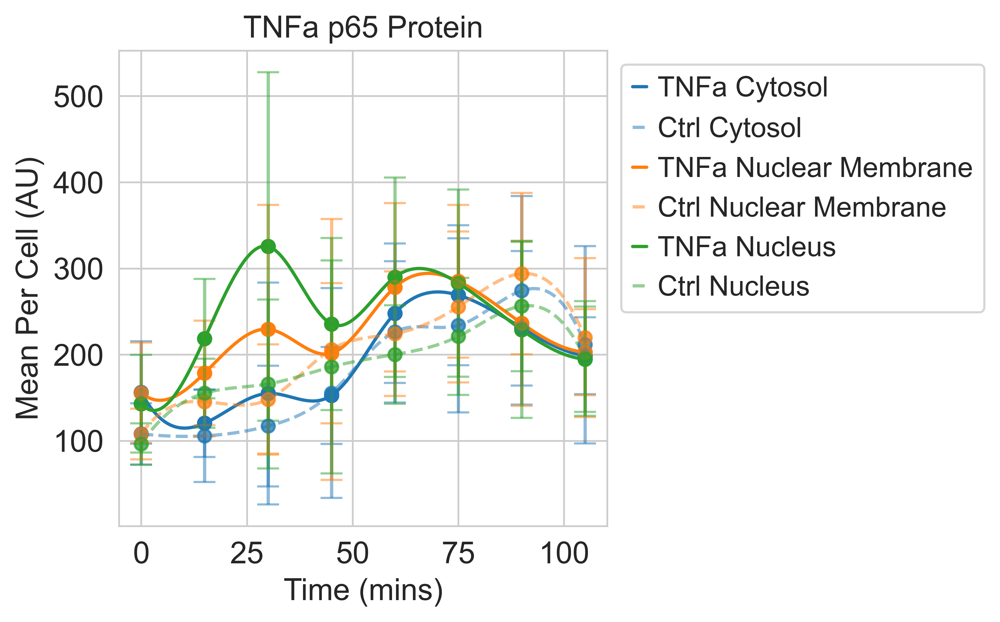

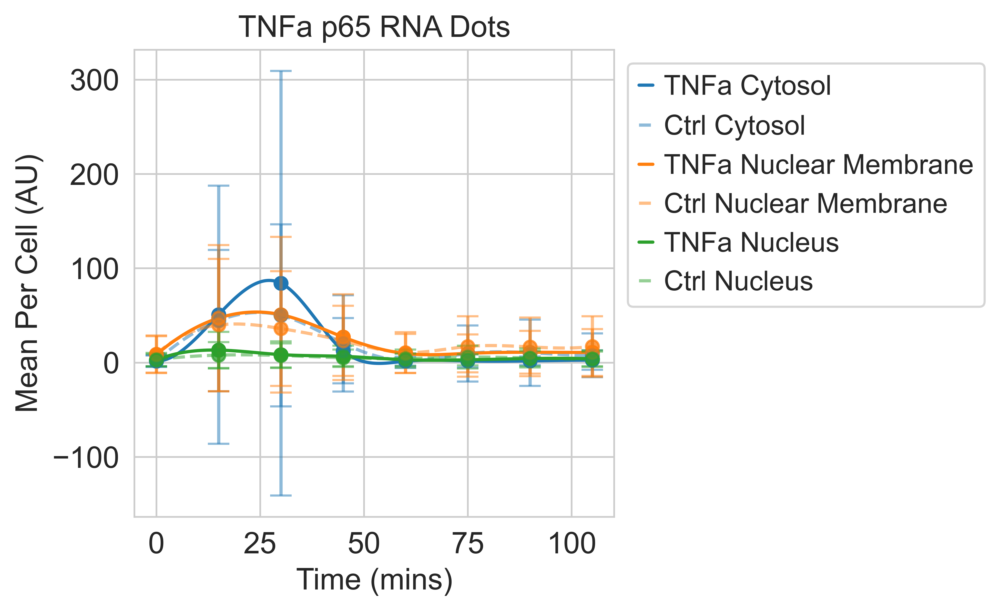

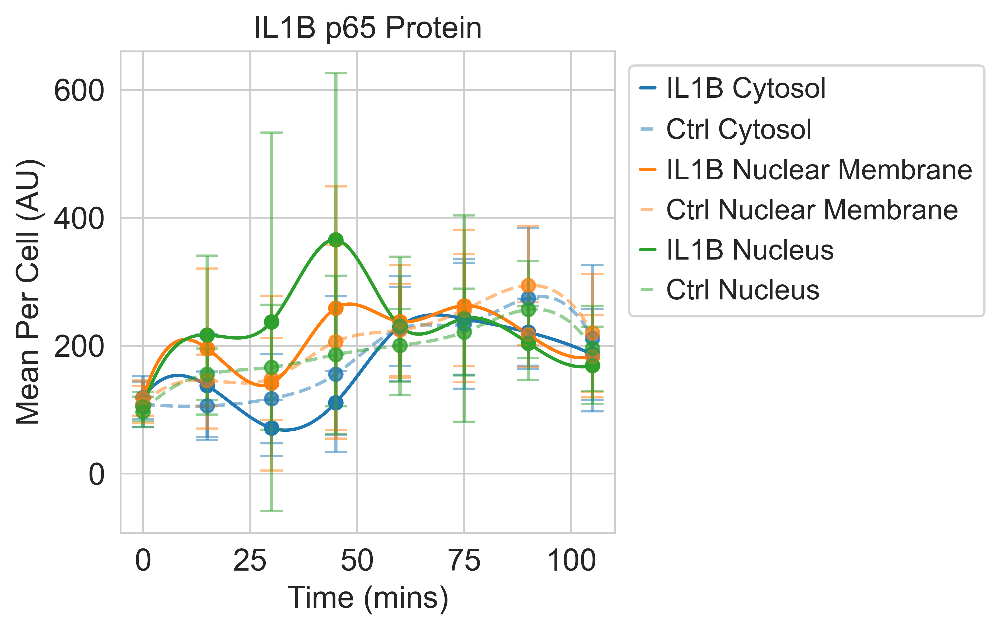

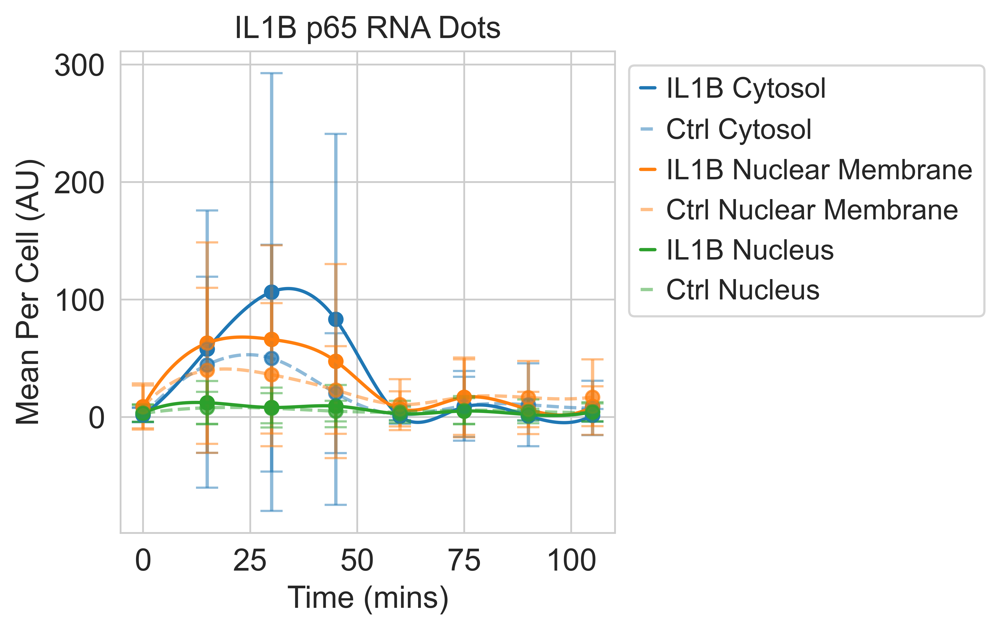

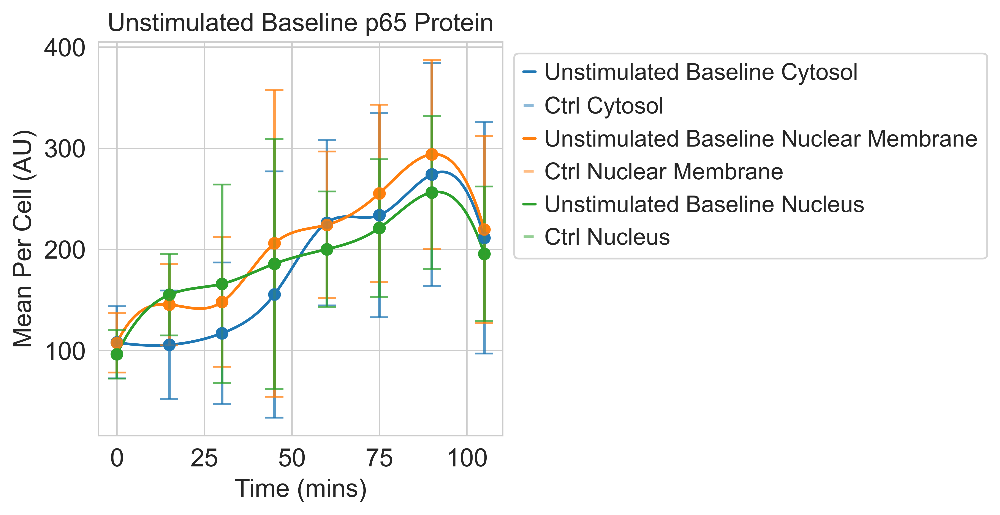

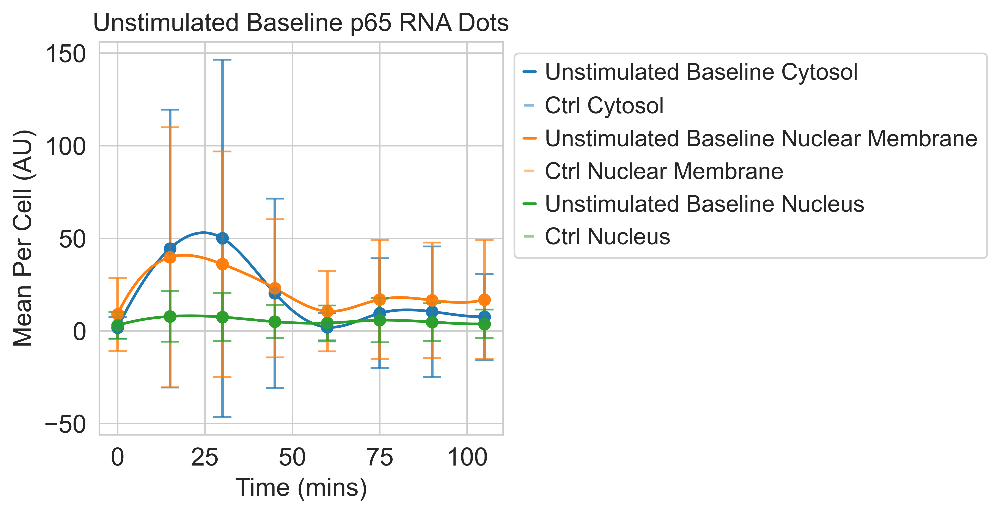

In [7]:
x = 'TimeStamp'
y = 'Signal'
hue = 'CellRegion'
style = 'Biomolecule'

# reformat dataframe
cols = [c for c in dfCell if 'p65' not in c]
dfLine = dfCell.melt(id_vars = cols, 
                     value_vars = ['p65 Protein', 'p65 RNA Dots'], 
                    var_name = style,
                   value_name = y)

# fig, ax = plt.subplots(dpi = 300)
# sns.lineplot(data = dfLine, x = x, y = y, hue = hue, style = style)
# ax.set_xlabel('Time (mins)')
# ax.set_ylabel('Biomolecule Signal (AU)')
# ax.set_title('Median p65 Protein')
# ax.set_yscale('log')

# interpolate each curve to make more smooth
for kk, drug in enumerate(dfLine['Drug'].unique()): # drugs vs control

    for ii, molec in enumerate(dfLine[style].unique()): # each biomolecule (RNA or protein)
        
        fig, ax = plt.subplots(dpi = 300)
        ax.set_xlabel('Time (mins)')
        ax.set_ylabel('Mean Per Cell (AU)')
        ax.set_title(drug + ' ' + molec)

        # colors per cell region
        colors = sns.color_palette('tab10', n_colors = len(dfLine[hue].unique()))
        
        for jj, region in enumerate(dfLine[hue].unique()): # each cell region
            
                dfSub = dfLine.loc[(dfLine[hue] == region) & 
                                (dfLine[style] == molec) & 
                                (dfLine['Drug'] == drug)]
                # scatter original data. Show error bars
                median = dfSub.groupby(x).mean().reset_index(drop = False)
                err = dfSub.groupby(x).std().reset_index(drop = False)
                alpha = 1 # transparency
                ax.scatter(median[x], median[y], label = '__' + region, color = colors[jj], alpha = alpha)
                ax.errorbar(median[x], median[y], yerr = err[y], fmt = 'o', 
                            label = '__' + region, color = colors[jj], alpha = 0.5, capsize=5)
                
                # interpolate curves. Make control curves dashed
                dfSub = dfSub.groupby([x]).mean()
                dfSub.reset_index(drop = False, inplace = True)
                # interpolate 1D curve
                func = scipy.interpolate.interp1d(x = dfSub[x], y = dfSub[y], kind = 'cubic')
                timeSmooth = np.linspace(dfSub[x].min(), dfSub[x].max(), 1000)
                spline = func(timeSmooth)
                sns.lineplot(x = timeSmooth, y = spline, label = drug + ' ' + region, color = colors[jj], alpha = alpha) # interpolated

                # also plot control
                dfSub = dfLine.loc[(dfLine[hue] == region) & 
                                (dfLine[style] == molec) & 
                                (dfLine['Drug'] == 'Unstimulated Baseline')]
                # scatter original data. Show error bars
                median = dfSub.groupby(x).mean().reset_index(drop = False)
                err = dfSub.groupby(x).std().reset_index(drop = False)
                alpha = 0.5 # transparency
                ax.scatter(median[x], median[y], label = '__' + region, color = colors[jj], alpha = alpha)
                ax.errorbar(median[x], median[y], yerr = err[y], fmt = 'o', 
                            label = '__' + region, color = colors[jj], alpha = 0.5, capsize=5)
                
                # interpolate curves. Make control curves dashed
                dfSub = dfSub.groupby([x]).mean()
                dfSub.reset_index(drop = False, inplace = True)
                # interpolate 1D curve
                func = scipy.interpolate.interp1d(x = dfSub[x], y = dfSub[y], kind = 'cubic')
                timeSmooth = np.linspace(dfSub[x].min(), dfSub[x].max(), 1000)
                spline = func(timeSmooth)
                ax.plot(timeSmooth, spline, label = 'Ctrl ' + region, color = colors[jj], linestyle = '--', alpha = alpha)
                    
        ax.legend(bbox_to_anchor = (1, 1), loc = 'upper left')    
        saveFigLabelTime(fig, title=drug + '_' + molec)

In [8]:
# update all axes bounds with min and max
def updateAllAxesLimits(axes, bounds, currMin, currMax, molec):
    
    if molec not in bounds.keys(): # first one. min and max not recorded yet
        bounds[molec] = [currMin, currMax] # update 
        return bounds # nothing else to update

    # else update all bounds if bounds are larger than current
    if currMin < bounds[molec][0]:
        bounds[molec] = [currMin, bounds[molec][1]] # update 
    if currMax > bounds[molec][1]:
        bounds[molec] = [bounds[molec][0], currMax] # update 

    # change all axes to reflect new bounds
    for ii, ax in enumerate(axes[molec]):
        ax.set_ylim(bounds[molec])

    return bounds

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2270784318.py:38: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfSub.groupby(x).mean().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2270784318.py:39: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  err = dfSub.groupby(x).std().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2270784318.py:57: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only colu

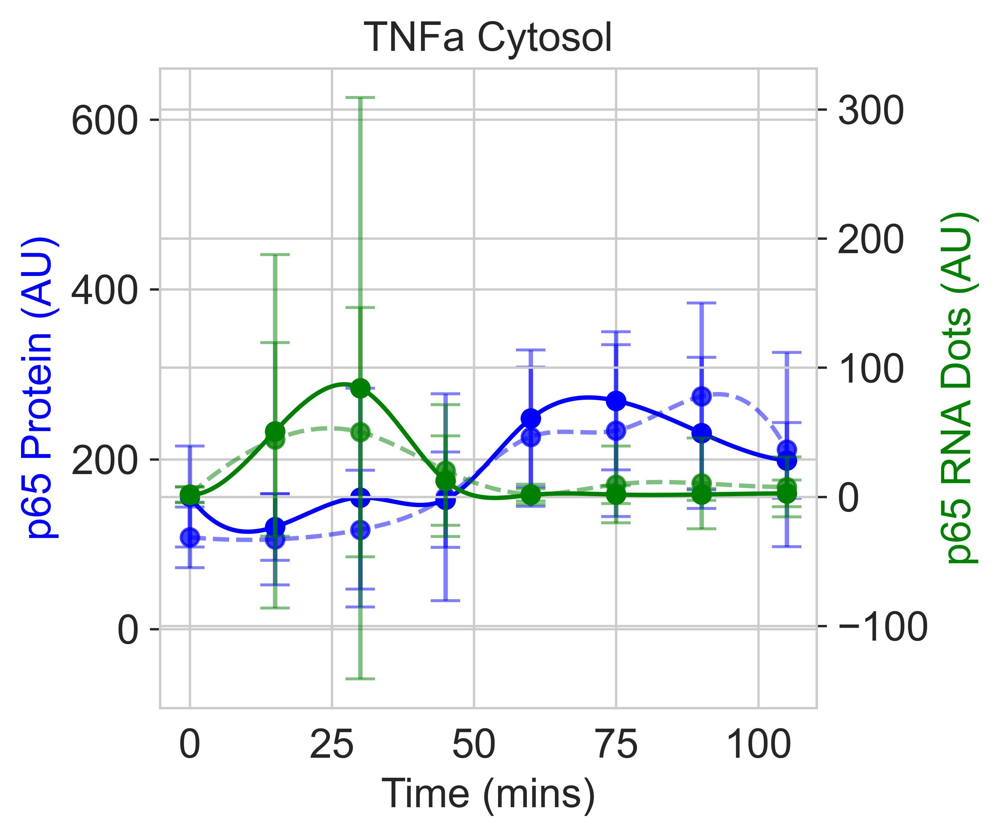

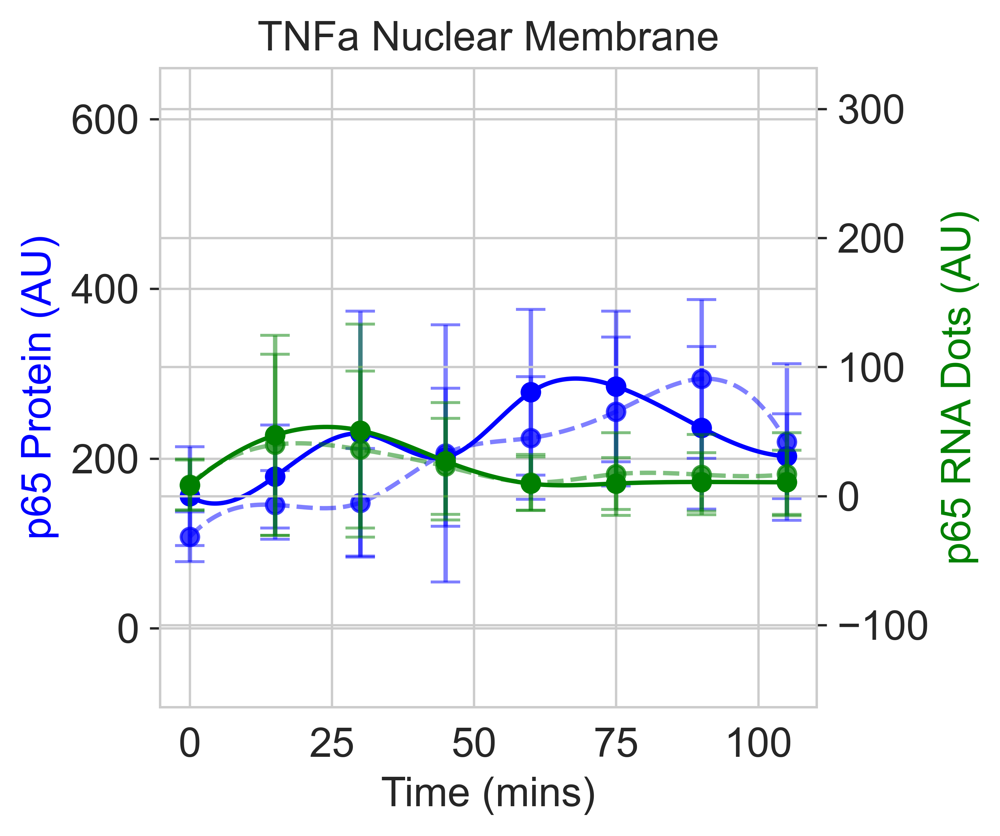

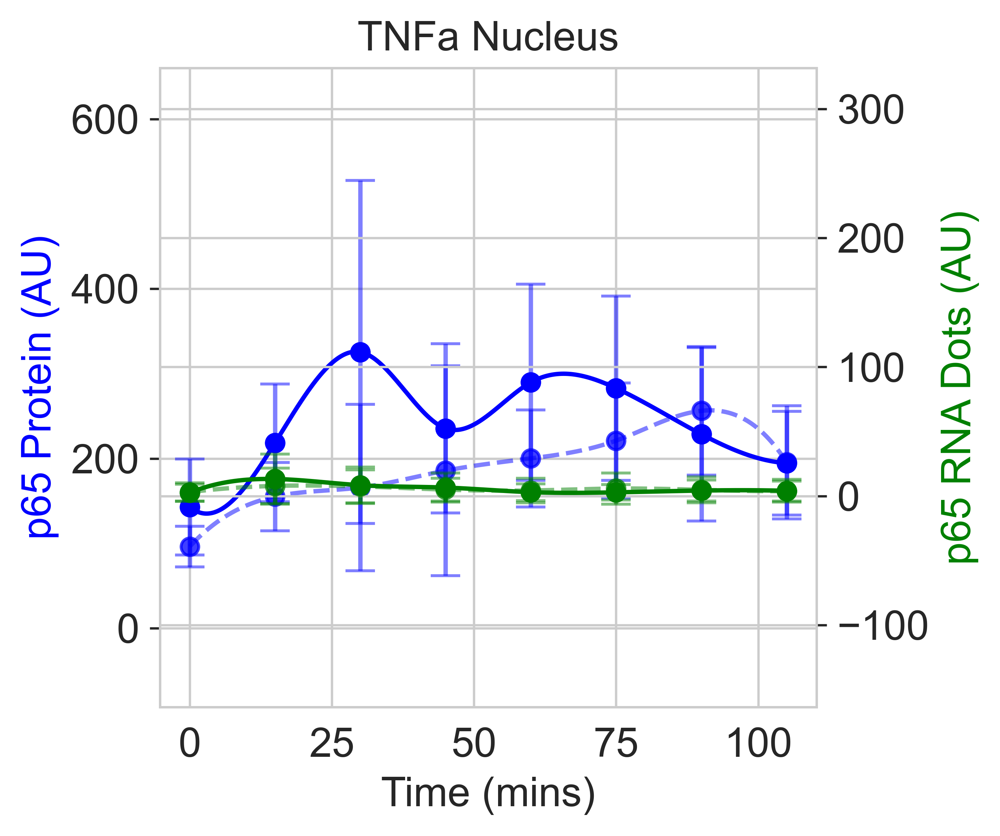

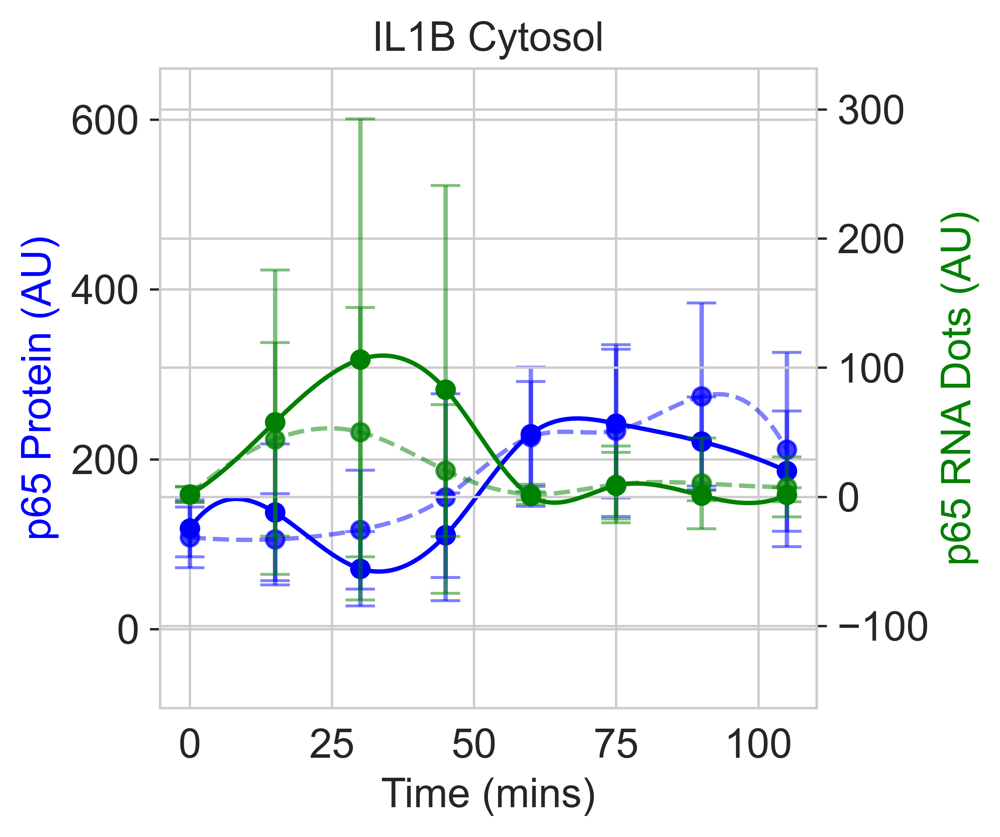

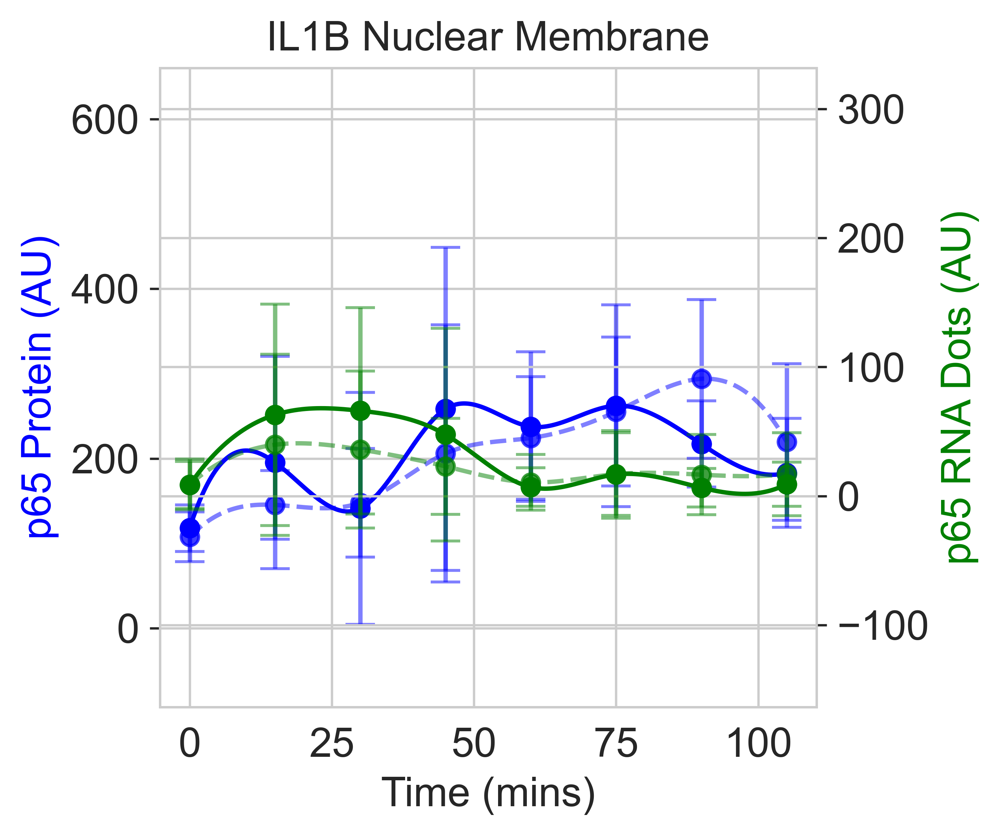

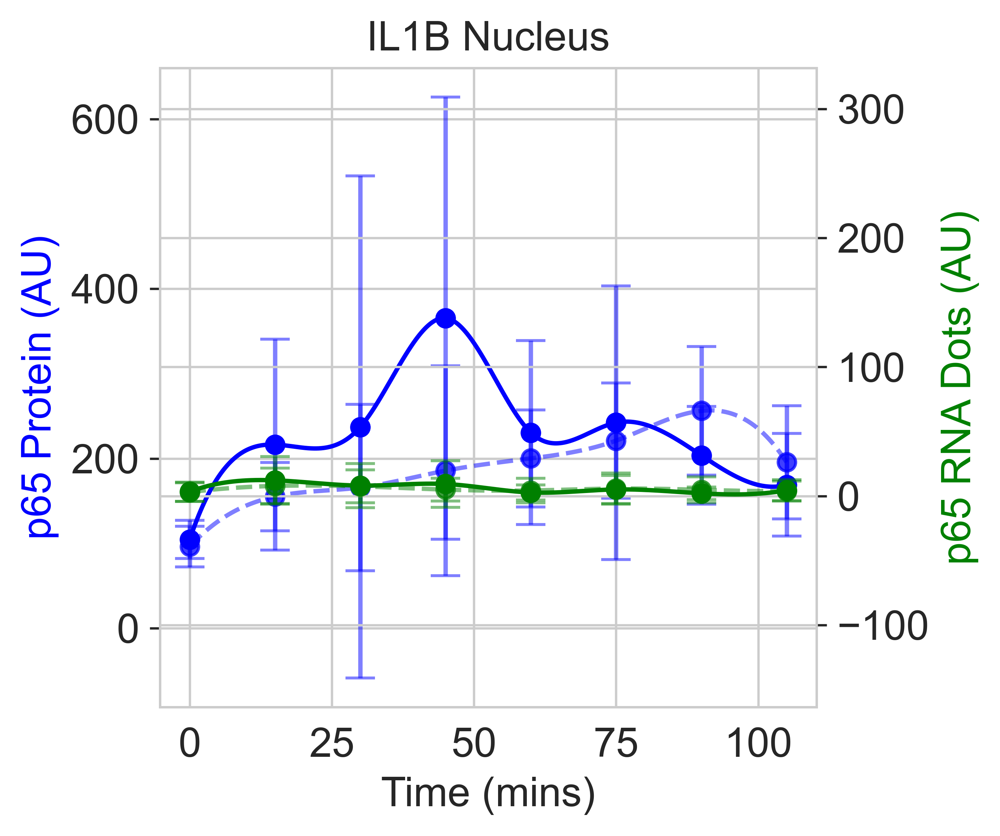

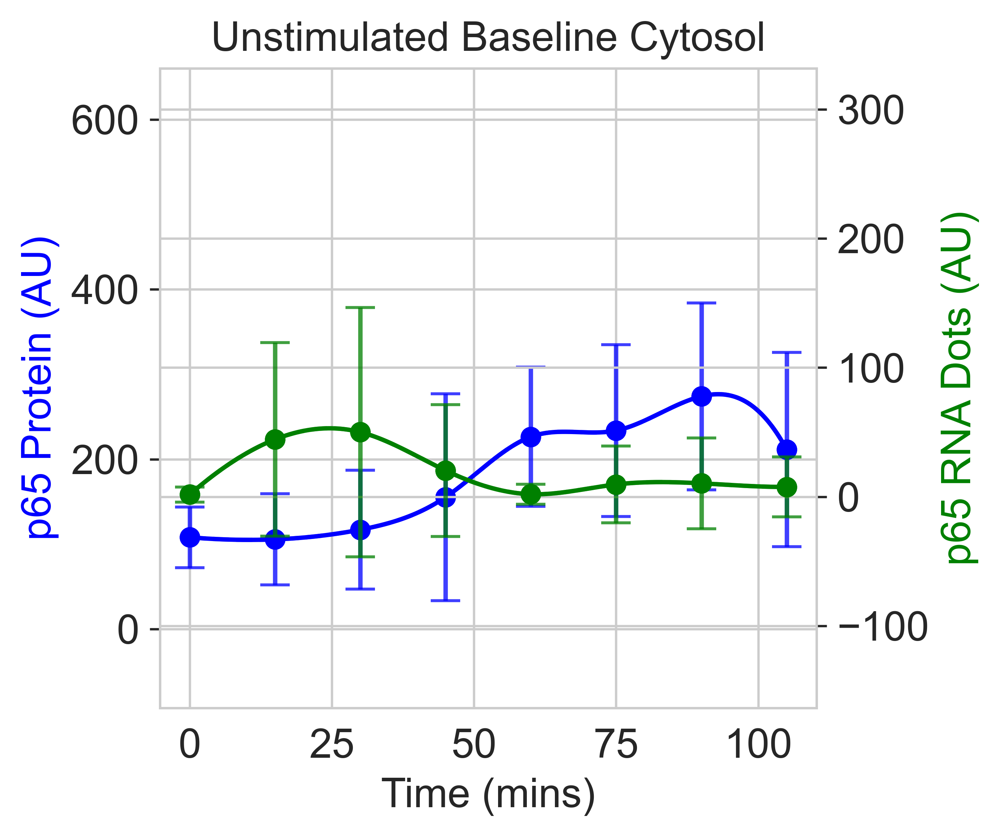

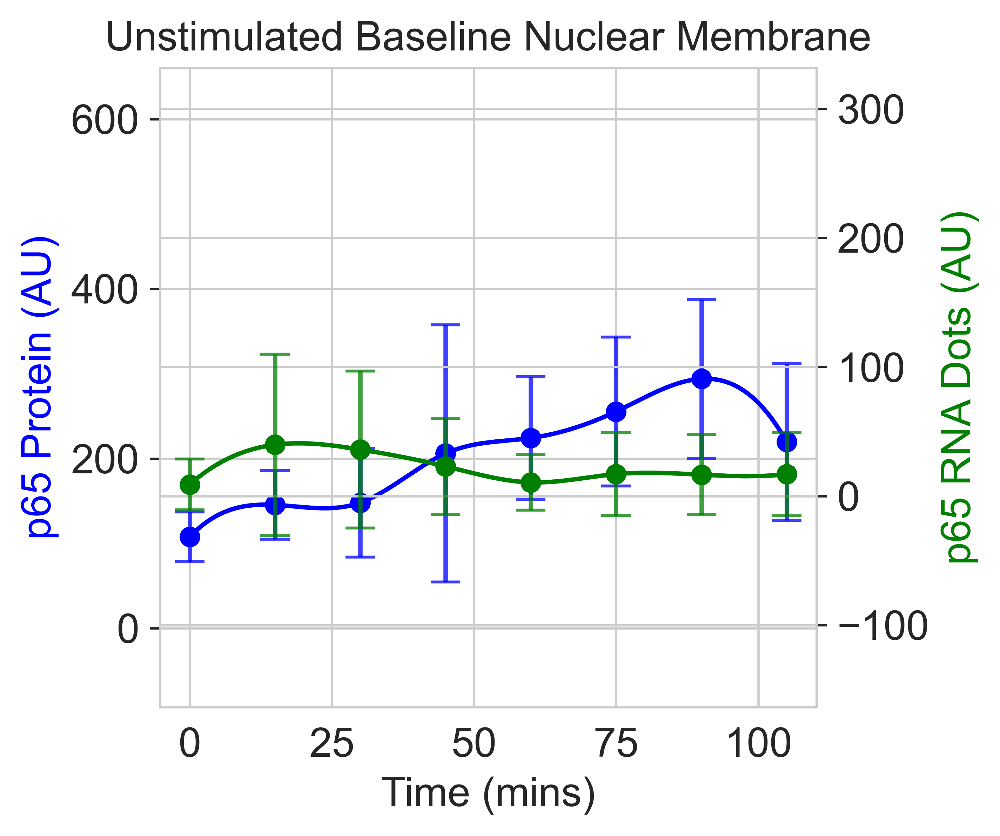

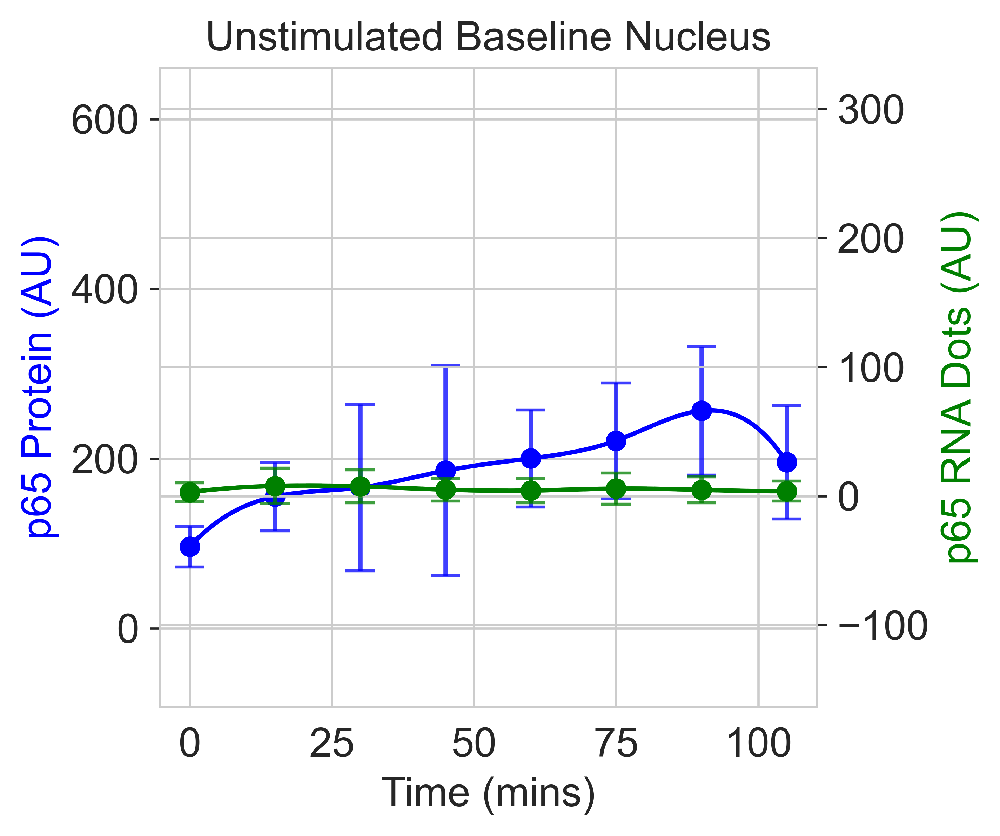

In [9]:
# Also separate plots by region. Two Y axes
# interpolate each curve to make more smooth
yBounds = {} # record y axis limits
allAxes = {} # record all axes objects to update and make y limits the same
allFigs = [] # record fig handles to save screenshot at end
allTitles = []
for kk, drug in enumerate(dfLine['Drug'].unique()): # drugs vs control

    for ii, region in enumerate(dfLine[hue].unique()): # each cell region

        # separate plots by treated and control
        # plot treated
        fig1, ax1 = plt.subplots(dpi = 300)
        ax1.set_xlabel('Time (mins)')
        ax1.set_title(drug + ' ' + region)
        ax2 = ax1.twinx() # applies twinx to ax2, which is the second y axis. 
        axes = [ax1, ax2]
        colors = ['blue', 'green']

        # # plot control
        # fig2, ax3 = plt.subplots(dpi = 300)
        # ax3.set_xlabel('Time (mins)')
        # ax3.set_title(drug + ' ' + region)
        # ax4 = ax3.twinx() # applies twinx to ax2, which is the second y axis. 
        # axes.extend([ax3, ax4])
        # colors = ['blue', 'green']

        allFigs.extend([fig1])
        allTitles.extend([drug + '_' + region])
        
        for jj, molec in enumerate(dfLine[style].unique()): # each biomolecule (RNA or protein)
                    
                dfSub = dfLine.loc[(dfLine[hue] == region) & 
                                (dfLine[style] == molec) & 
                                (dfLine['Drug'] == drug)]
                # dfSub.dropna(how = 'any', inplace = True)
                # scatter original data. Show error bars
                median = dfSub.groupby(x).mean().reset_index(drop = False)
                err = dfSub.groupby(x).std().reset_index(drop = False)
                ax = axes[jj]
                alpha = 1 # transparency
                ax.scatter(median[x], median[y], label = '__', color = colors[jj], alpha=alpha)
                ax.errorbar(median[x], median[y], yerr = err[y], fmt = 'o', label = '__', color = colors[jj], alpha = 0.5, capsize=5)

                # # boxplot overlay with lineplot
                # bins, groups = zip(*dfSub.groupby(x)[y])
                # lengths = np.array([len(group) for group in groups])
                # ax = axes[jj]
                # ax.boxplot(groups, positions=dfSub[x].unique(), widths=5,
                #         patch_artist=True, boxprops={'facecolor': [1, 1, 1, 0.5], 
                #                                      'edgecolor': colors[jj], 'linewidth': 1.5}, 
                #         medianprops={'color': 'black'}, 
                #         flierprops={'markersize': 2, 'marker': 'o', 'color': colors[jj]}, 
                #         showfliers=False)
                                
                # interpolate curves
                dfSub = dfSub.groupby([x]).mean()
                dfSub.reset_index(drop = False, inplace = True)
                # interpolate 1D curve
                func = scipy.interpolate.interp1d(x = dfSub[x], y = dfSub[y], kind = 'cubic')
                timeSmooth = np.linspace(dfSub[x].min(), dfSub[x].max(), 1000)
                spline = func(timeSmooth)
                sns.lineplot(x = timeSmooth, y = spline, label = drug, color = colors[jj], ax = axes[jj], alpha = alpha) # interpolated

                ######################### plot control on same plot
                dfSub = dfLine.loc[(dfLine[hue] == region) & 
                                (dfLine[style] == molec) & 
                                (dfLine['Drug'] == 'Unstimulated Baseline')]
                # scatter original data. Show error bars
                median = dfSub.groupby(x).mean().reset_index(drop = False)
                err = dfSub.groupby(x).std().reset_index(drop = False)
                ax = axes[jj]
                alpha = 0.5 # transparency
                ax.scatter(median[x], median[y], label = '__', color = colors[jj], alpha = alpha)
                ax.errorbar(median[x], median[y], yerr = err[y], fmt = 'o', label = '__', color = colors[jj], alpha = 0.5, capsize=5)

                # # boxplot overlay with lineplot
                # bins, groups = zip(*dfSub.groupby(x)[y])
                # lengths = np.array([len(group) for group in groups])
                # ax = axes[jj + 2]
                # ax.boxplot(groups, positions=dfSub[x].unique(), widths=5,
                #         patch_artist=True, boxprops={'facecolor': [1, 1, 1, 0.5], 
                #                                      'edgecolor': colors[jj], 'linewidth': 1.5}, 
                #         medianprops={'color': colors[jj]}, 
                #         flierprops={'markersize': 2, 'marker': 'o', 'color': colors[jj]})
                                
                # interpolate curves
                dfSub = dfSub.groupby([x]).mean()
                dfSub.reset_index(drop = False, inplace = True)
                # interpolate 1D curve
                func = scipy.interpolate.interp1d(x = dfSub[x], y = dfSub[y], kind = 'cubic')
                timeSmooth = np.linspace(dfSub[x].min(), dfSub[x].max(), 1000)
                spline = func(timeSmooth)
                ax.plot(timeSmooth, spline, label = 'Unstimulated Baseline', color = colors[jj], linestyle = '--', alpha = alpha)

                # label corresponding y axis
                ax = axes[jj]
                ax.set_ylabel(molec + ' (AU)', color = colors[jj])
                ax.get_legend().remove()

                # keep y bounds the same as whole cell plot
                if molec not in allAxes.keys():
                    allAxes[molec] = [ax]
                allAxes[molec].append(ax)
                currMin, currMax = ax.get_ylim()
                yBounds = updateAllAxesLimits(axes = allAxes, bounds = yBounds, \
                    currMin = currMin, currMax = currMax, molec = molec)
                                                                
# save all updated figures
for ii, (fig, title) in enumerate(zip(allFigs, allTitles)): # each figure
    saveFigLabelTime(fig, title=title)

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:20: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfSub.groupby(x).mean().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:21: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  err = dfSub.groupby(x).std().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:27: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only colu

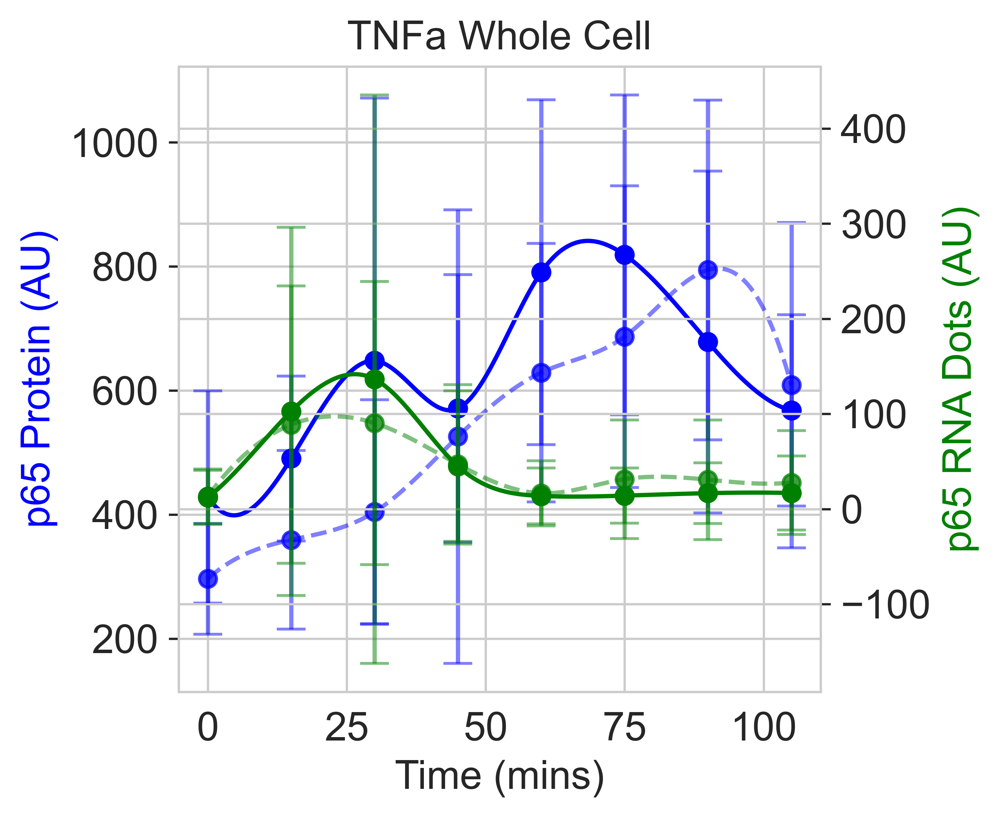

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:20: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfSub.groupby(x).mean().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:21: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  err = dfSub.groupby(x).std().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:27: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only colu

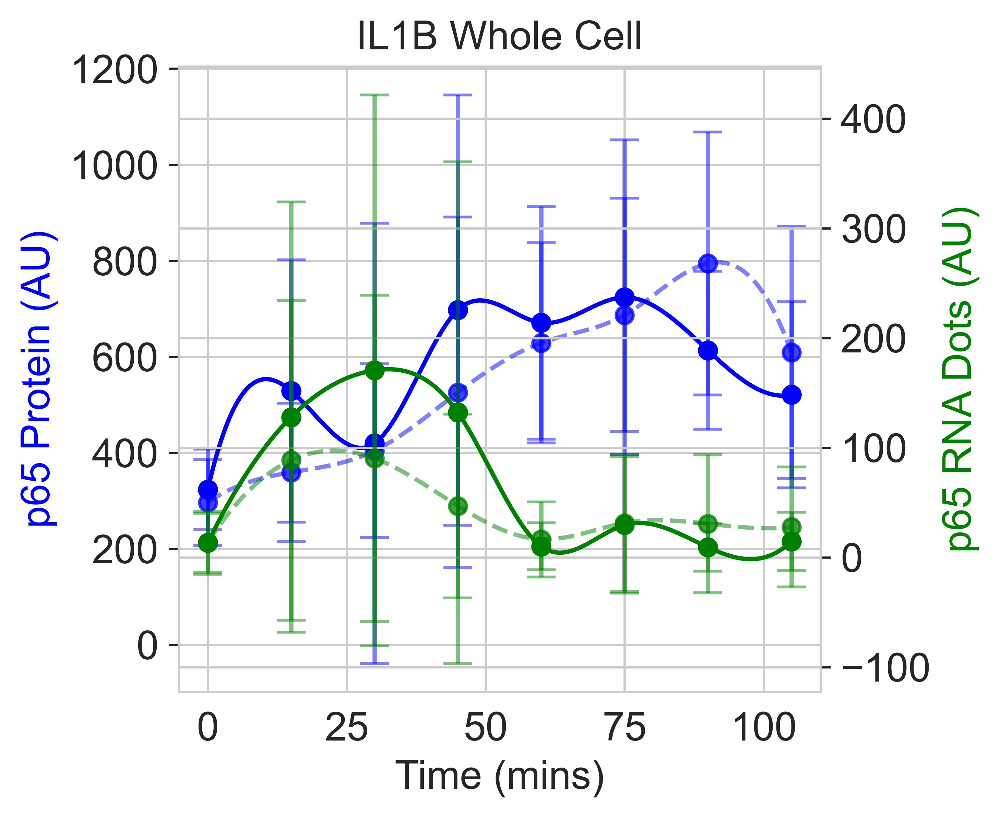

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:20: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfSub.groupby(x).mean().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:21: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  err = dfSub.groupby(x).std().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3426196184.py:27: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only colu

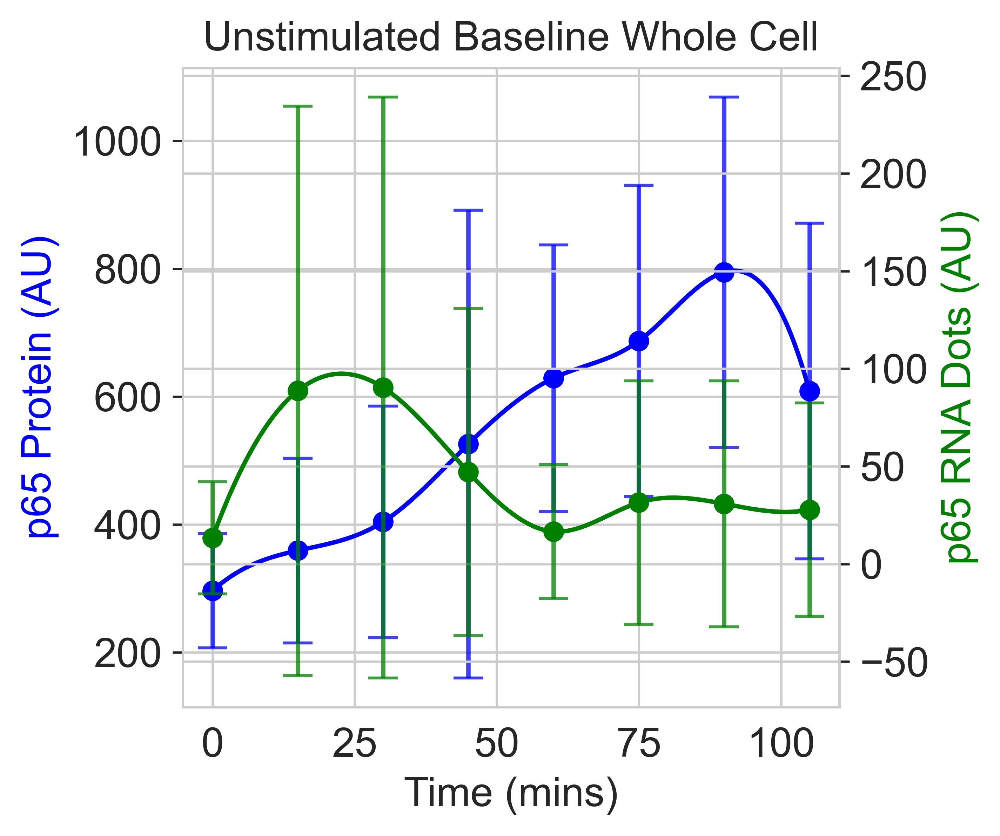

In [10]:
# plot whole cell. Does it oscillate?
dfWholeCell = dfLine.groupby(['Drug', 'TimeStamp', 'Biomolecule', 'CellLabel']).agg({'Signal': 'sum'})
dfWholeCell.reset_index(drop = False, inplace = True)

for kk, drug in enumerate(dfLine['Drug'].unique()): # drugs vs control

    fig, ax1 = plt.subplots(dpi = 300)
    ax1.set_xlabel('Time (mins)')
    ax1.set_title(drug + ' Whole Cell')

    ax2 = ax1.twinx() # applies twinx to ax2, which is the second y axis. 
    axes = [ax1, ax2]
    colors = ['blue', 'green']
        
    for jj, molec in enumerate(dfLine[style].unique()): # each biomolecule (RNA or protein)
                
        dfSub = dfWholeCell.loc[(dfWholeCell[style] == molec) & 
                        (dfWholeCell['Drug'] == drug)]
        # scatter original data. Show error bars
        median = dfSub.groupby(x).mean().reset_index(drop = False)
        err = dfSub.groupby(x).std().reset_index(drop = False)
        ax = axes[jj]
        alpha = 1 # transparency
        ax.scatter(median[x], median[y], label = '__', color = colors[jj], alpha=alpha)
        ax.errorbar(median[x], median[y], yerr = err[y], fmt = 'o', label = '__', color = colors[jj], alpha = 0.5, capsize=5)
        # interpolate curves
        dfSub = dfSub.groupby([x]).mean()
        dfSub.reset_index(drop = False, inplace = True)
        # interpolate 1D curve
        func = scipy.interpolate.interp1d(x = dfSub[x], y = dfSub[y], kind = 'cubic')
        timeSmooth = np.linspace(dfSub[x].min(), dfSub[x].max(), 1000)
        spline = func(timeSmooth)
        sns.lineplot(x = timeSmooth, y = spline, label = drug, color = colors[jj], ax = axes[jj], alpha = alpha) # interpolated

        # plot control on same plot
        dfSub = dfWholeCell.loc[(dfWholeCell[style] == molec) & 
                        (dfWholeCell['Drug'] == 'Unstimulated Baseline')]
        # scatter original data. Show error bars
        median = dfSub.groupby(x).mean().reset_index(drop = False)
        err = dfSub.groupby(x).std().reset_index(drop = False)
        ax = axes[jj]
        alpha = 0.5 # transparency
        ax.scatter(median[x], median[y], label = '__', color = colors[jj], alpha = alpha)
        ax.errorbar(median[x], median[y], yerr = err[y], fmt = 'o', label = '__', color = colors[jj], alpha = 0.5, capsize=5)
        # interpolate curves
        dfSub = dfSub.groupby([x]).mean()
        dfSub.reset_index(drop = False, inplace = True)
        # interpolate 1D curve
        func = scipy.interpolate.interp1d(x = dfSub[x], y = dfSub[y], kind = 'cubic')
        timeSmooth = np.linspace(dfSub[x].min(), dfSub[x].max(), 1000)
        spline = func(timeSmooth)
        ax.plot(timeSmooth, spline, label = 'Unstimulated Baseline', color = colors[jj], linestyle = '--', alpha = alpha)

        # label corresponding y axis
        ax = axes[jj]
        ax.set_ylabel(molec + ' (AU)', color = colors[jj])
        ax.get_legend().remove()

    saveFigLabelTime(fig, title = drug + '_WholeCell')
    plt.show()

# Boxplot of median nuclear / cytosol ratio over time. Compare drugs vs control. Show w/ and w/o outliers

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\616576066.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfDrug.dropna(subset = ['NucCytoRatio'], inplace = True)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\616576066.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfDrug.groupby(x).median().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\616576066.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

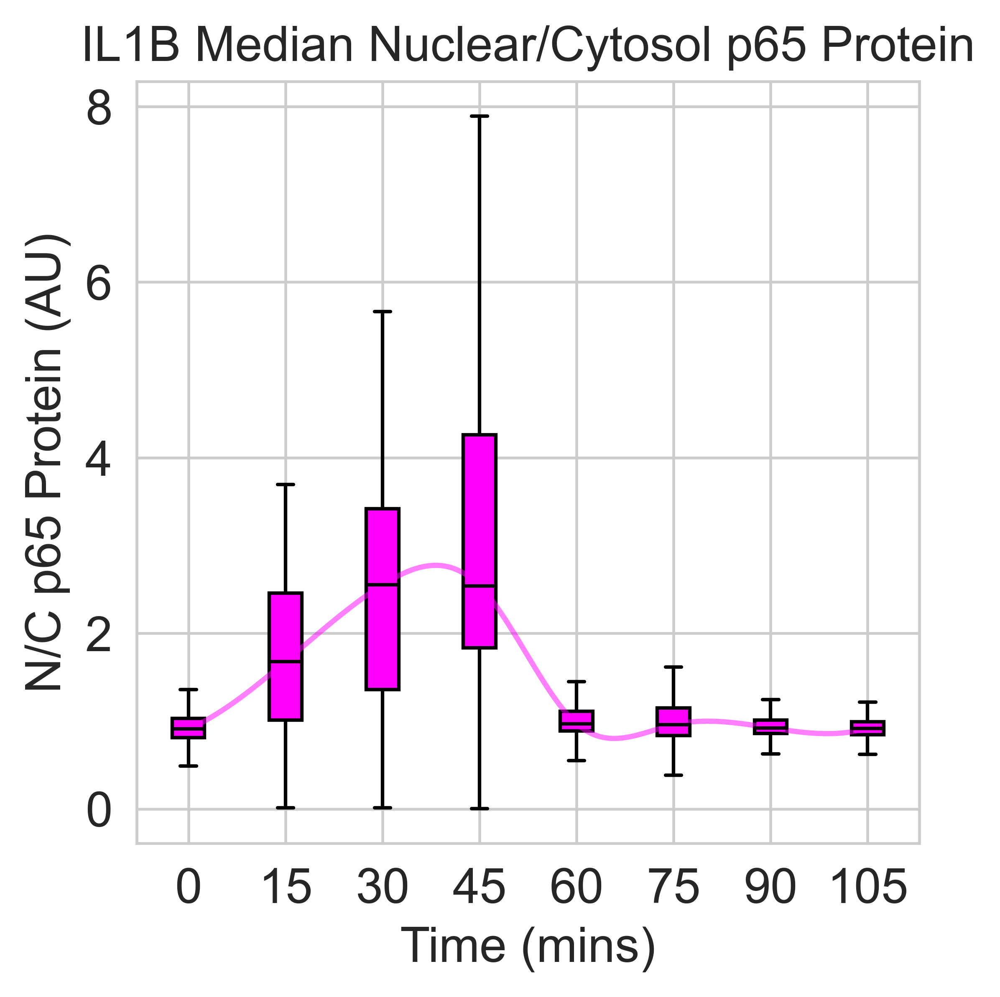

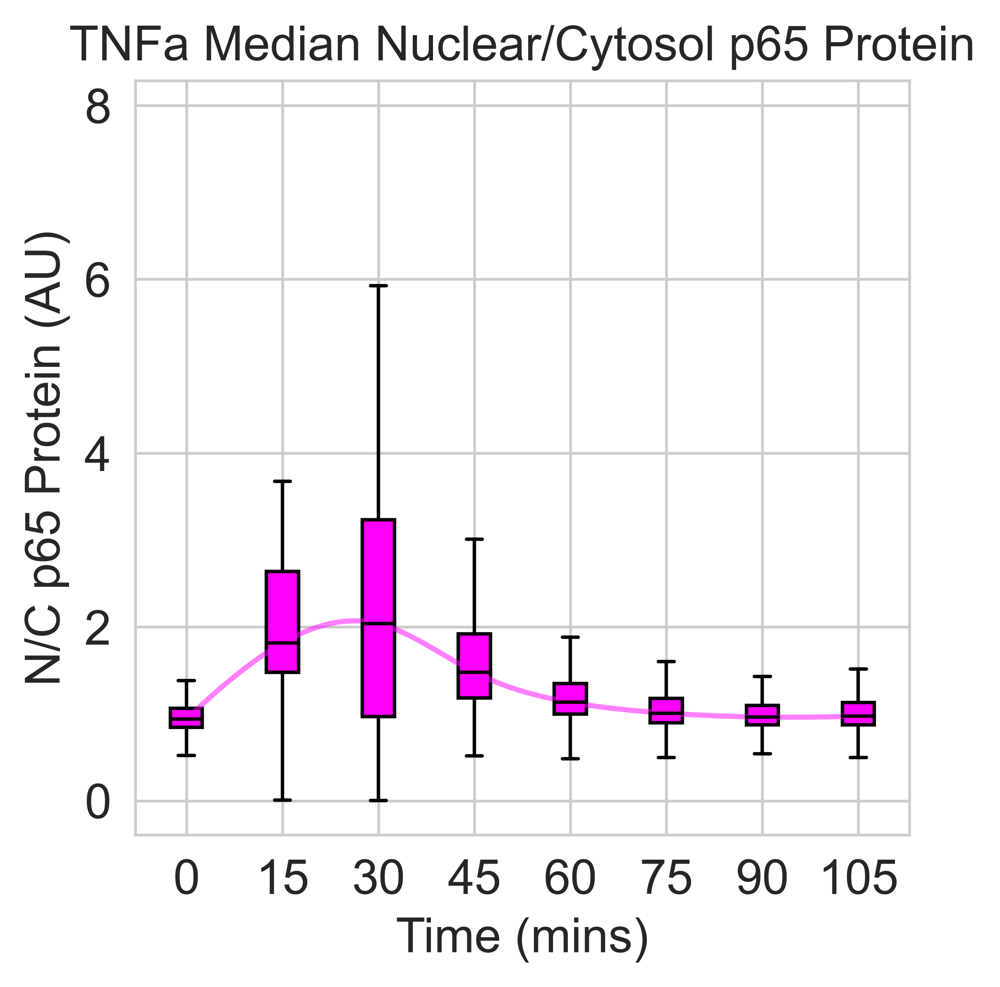

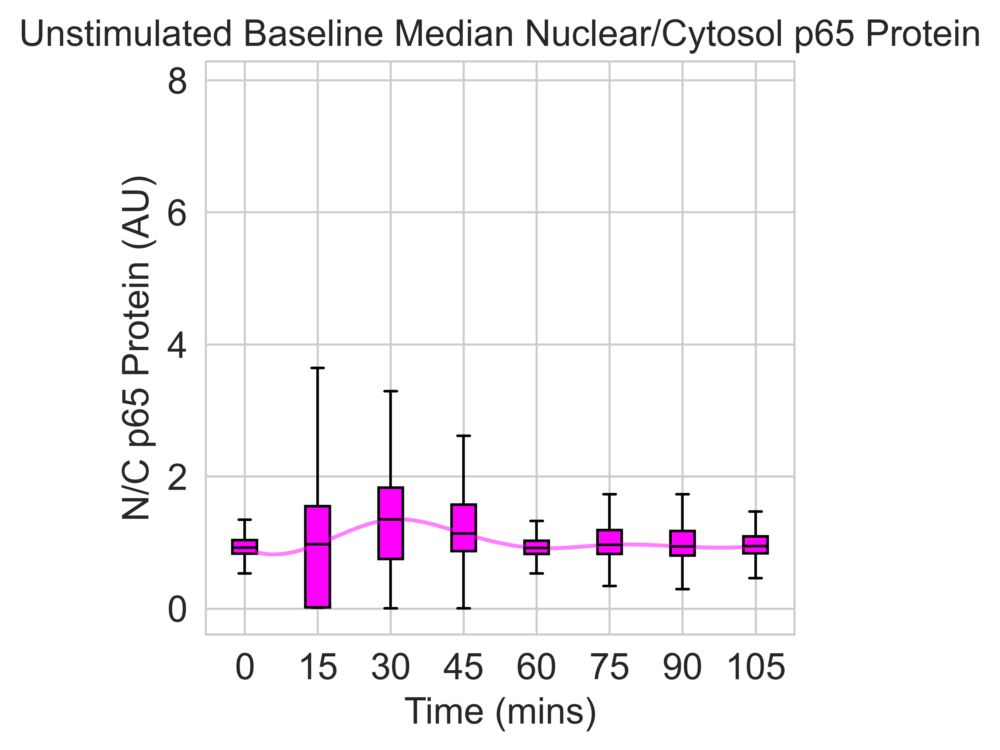

In [11]:
x = 'TimeStamp'
y = 'NucCytoRatio'

dfSub = dfLine.groupby(['Drug', 'TimeStamp', 'CellLabel']).agg({'NucCytoRatio': 'first'})
dfSub.reset_index(drop = False, inplace = True)

allFigs = []
allTitles = []
yMin = 0
yMax = 0
for ii, drug in enumerate(dfSub['Drug'].unique()): # each drug

    dfDrug = dfSub.loc[dfSub['Drug'] == drug]
    # drop nan
    dfDrug.dropna(subset = ['NucCytoRatio'], inplace = True)

    fig, ax = plt.subplots(dpi = 300)
    allFigs.append(fig)
    allTitles.append(drug + '_MedianNucCytoRatio_IQR')
    ax.set_xlabel('Time (mins)')
    ax.set_ylabel('N/C p65 Protein (AU)')
    ax.set_title(drug + ' Median Nuclear/Cytosol p65 Protein')

    # boxplot overlay with lineplot
    bins, groups = zip(*dfDrug.groupby(x)[y])
    lengths = np.array([len(group) for group in groups])
    ax.boxplot(groups, positions=dfDrug[x].unique(), widths=5,
            patch_artist=True, boxprops={'facecolor': 'magenta'}, 
            medianprops={'color': 'black'}, 
            flierprops={'markersize': 2, 'marker': 'o', 'color': 'black'},
            showfliers=False)

    # interpolate boxplot curve
    median = dfDrug.groupby(x).median().reset_index(drop = False)
    func = scipy.interpolate.interp1d(x = median[x], y = median[y], kind = 'cubic')
    timeSmooth = np.arange(median[x].min(), median[x].max(), 0.1)
    spline = func(timeSmooth)
    dfInterp = pd.DataFrame({x: timeSmooth, y: spline})
    sns.lineplot(data = dfInterp, x = x, y = y, color = 'magenta', alpha = alpha, ax = ax) # interpolated
    
#     ax.set_yscale('log')

    # keep same y axis limits
    currMin, currMax = ax.get_ylim()
    if currMin < yMin: # update min and max
        yMin = currMin
    if currMax > yMax:
        yMax = currMax
    # update axes
    ax.set_ylim([yMin, yMax])
    # yBounds = updateAllAxesLimits(axes = allAxes, bounds = yBounds, \
    #     currMin = currMin, currMax = currMax, molec = molec)

for ii, (fig, title) in enumerate(zip(allFigs, allTitles)): # each figure
    saveFigLabelTime(fig, title=title)

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2538320380.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfDrug.dropna(subset = ['NucCytoRatio'], inplace = True)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2538320380.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median = dfDrug.groupby(x).median().reset_index(drop = False)
C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\2538320380.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/index

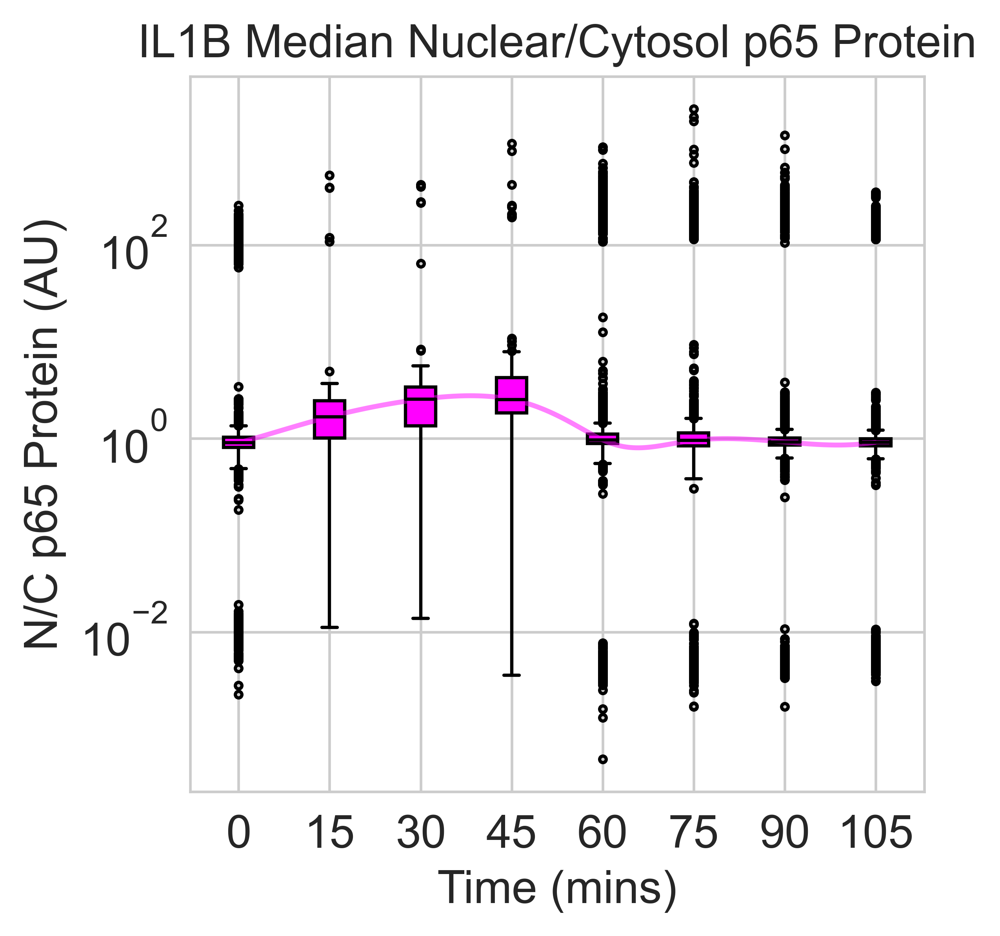

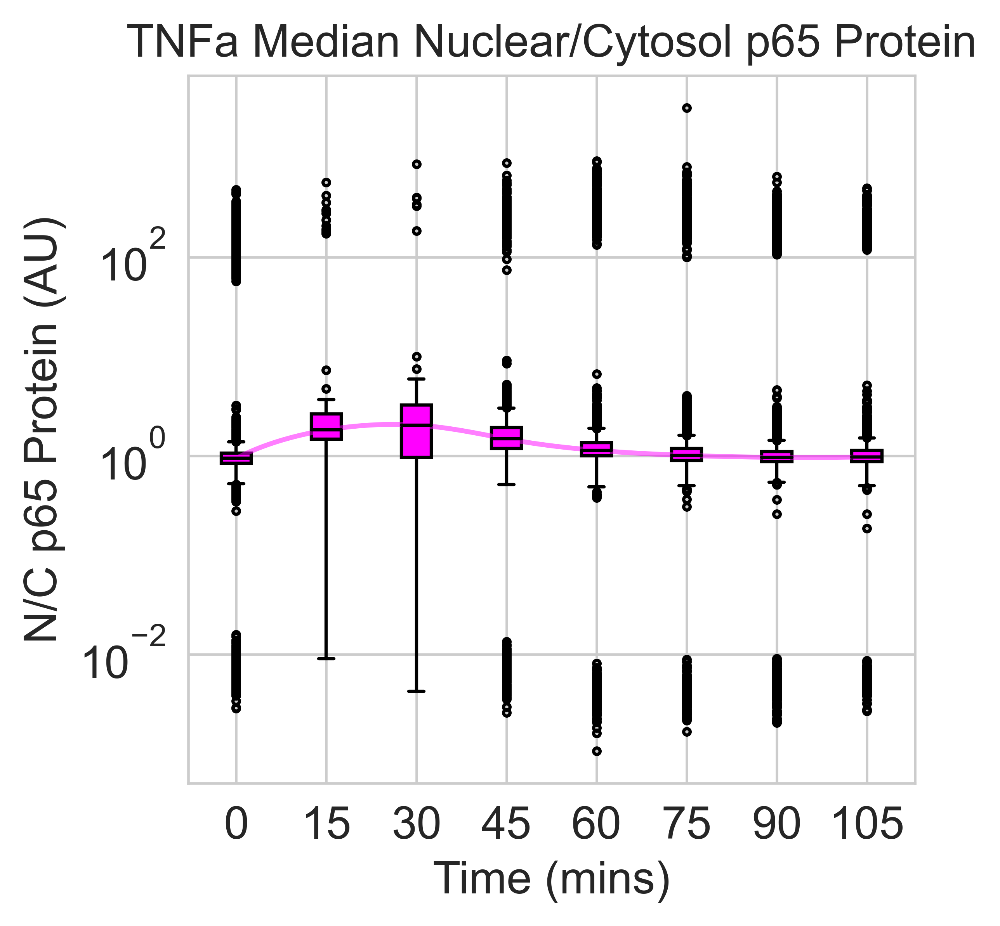

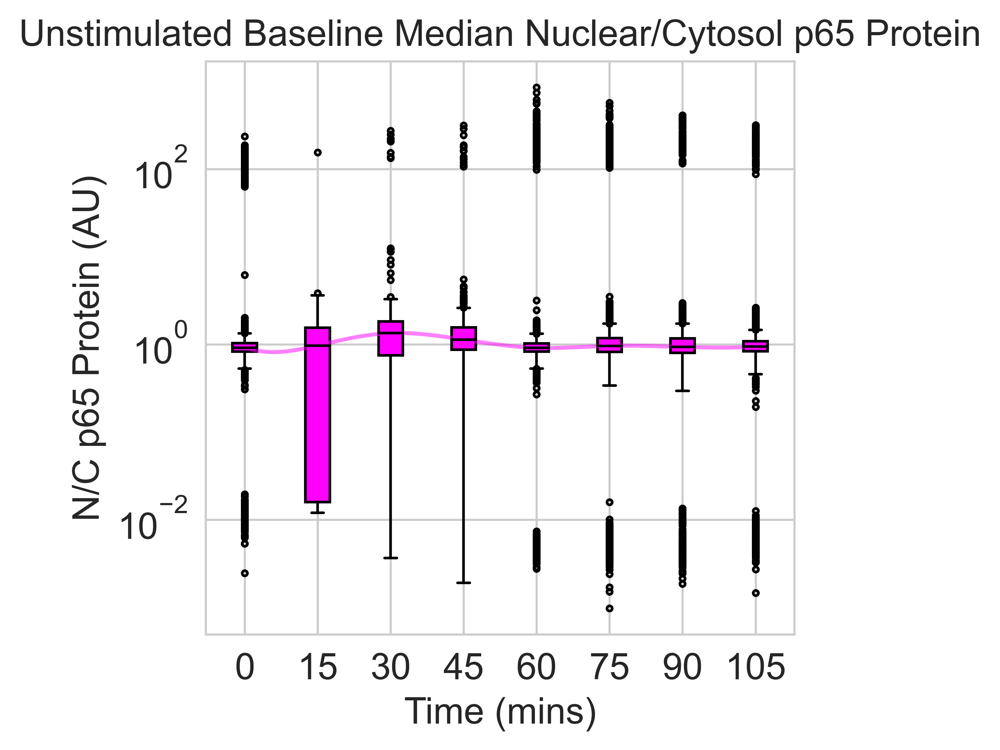

In [12]:
x = 'TimeStamp'
y = 'NucCytoRatio'

dfSub = dfLine.groupby(['Drug', 'TimeStamp', 'CellLabel']).agg({'NucCytoRatio': 'first'})
dfSub.reset_index(drop = False, inplace = True)

allFigs = []
allTitles = []
yMin = 0
yMax = 0
for ii, drug in enumerate(dfSub['Drug'].unique()): # each drug

    dfDrug = dfSub.loc[dfSub['Drug'] == drug]
    # drop nan
    dfDrug.dropna(subset = ['NucCytoRatio'], inplace = True)

    fig, ax = plt.subplots(dpi = 300)
    allFigs.append(fig)
    allTitles.append(drug + '_MedianNucCytoRatio_raw')
    ax.set_xlabel('Time (mins)')
    ax.set_ylabel('N/C p65 Protein (AU)')
    ax.set_title(drug + ' Median Nuclear/Cytosol p65 Protein')

    # boxplot overlay with lineplot
    bins, groups = zip(*dfDrug.groupby(x)[y])
    lengths = np.array([len(group) for group in groups])
    ax.boxplot(groups, positions=dfDrug[x].unique(), widths=5,
            patch_artist=True, boxprops={'facecolor': 'magenta'}, 
            medianprops={'color': 'black'}, 
            flierprops={'markersize': 2, 'marker': 'o', 'color': 'black'},
            showfliers=True)

    # interpolate boxplot curve
    median = dfDrug.groupby(x).median().reset_index(drop = False)
    func = scipy.interpolate.interp1d(x = median[x], y = median[y], kind = 'cubic')
    timeSmooth = np.arange(median[x].min(), median[x].max(), 0.1)
    spline = func(timeSmooth)
    dfInterp = pd.DataFrame({x: timeSmooth, y: spline})
    sns.lineplot(data = dfInterp, x = x, y = y, color = 'magenta', alpha = alpha, ax = ax) # interpolated
    
#     ax.set_yscale('log')

    # keep same y axis limits
    currMin, currMax = ax.get_ylim()
    if currMin < yMin: # update min and max
        yMin = currMin
    if currMax > yMax:
        yMax = currMax
    # update axes
    # ax.set_ylim([yMin, yMax])
    # yBounds = updateAllAxesLimits(axes = allAxes, bounds = yBounds, \
    #     currMin = currMin, currMax = currMax, molec = molec)
    ax.set_yscale('log')

for ii, (fig, title) in enumerate(zip(allFigs, allTitles)): # each figure
    saveFigLabelTime(fig, title = title)

# Scatterplot GAPDH RNA over time 

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\3068497221.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dfSub = dfCell.groupby(['Drug', 'TimeStamp', 'FOV', 'CellLabel']).sum()


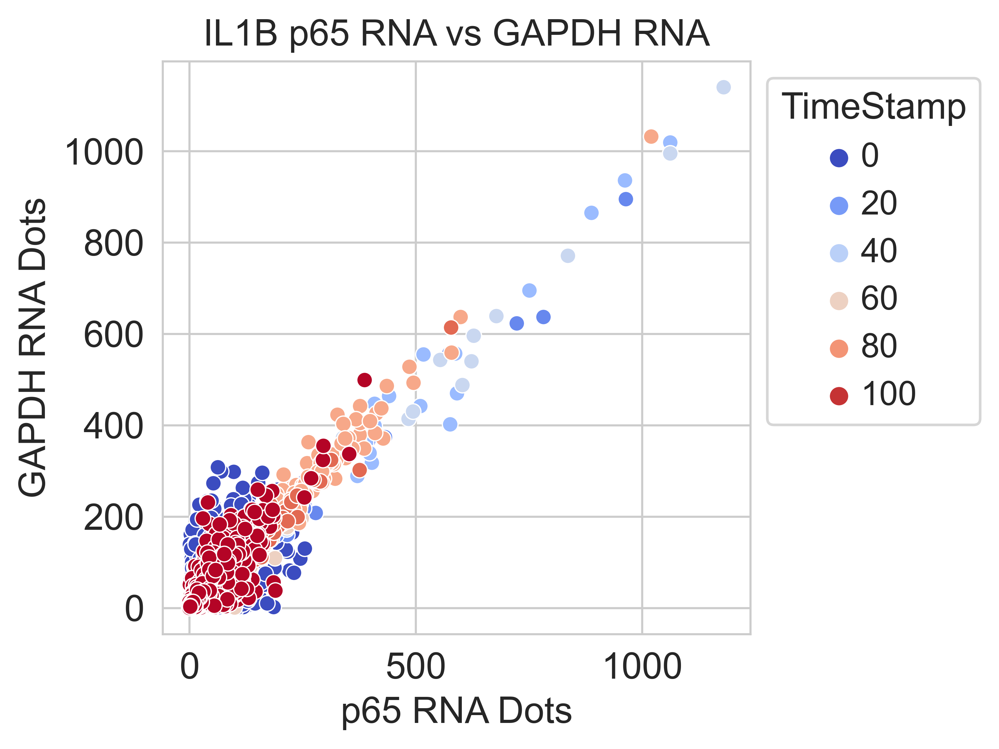

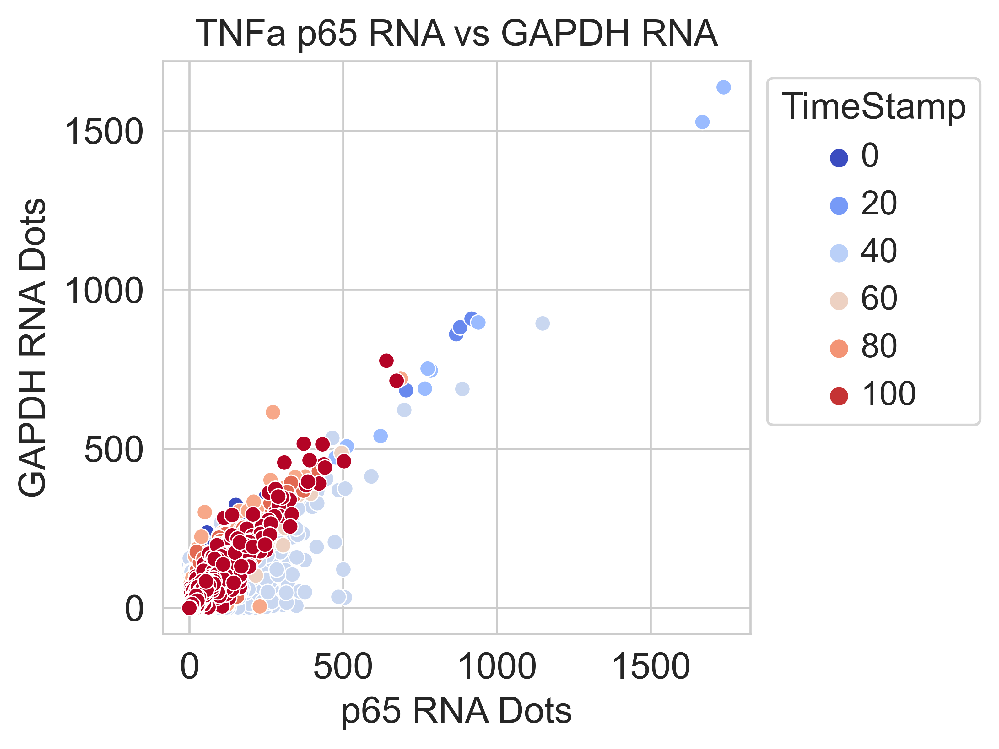

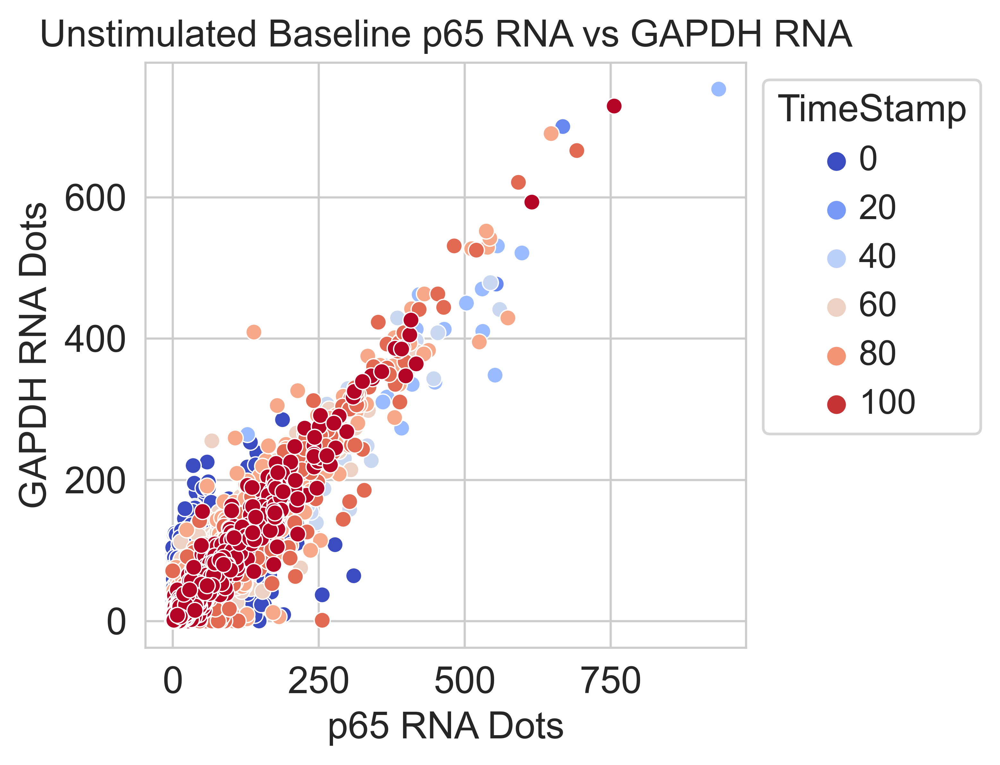

In [13]:
dfSub = dfCell.groupby(['Drug', 'TimeStamp', 'FOV', 'CellLabel']).sum()
dfSub.drop(columns = ['NucCytoRatio'], inplace = True, errors = 'ignore')
dfSub.reset_index(drop = False, inplace = True)

# scatter RNAs
x = 'p65 RNA Dots'
y = 'GAPDH RNA Dots'
hue = 'TimeStamp'

for ii, drug in enumerate(dfSub['Drug'].unique()): # each drug

    dfDrug = dfSub.loc[dfSub['Drug'] == drug]

    fig, ax = plt.subplots(dpi = 300)
    sns.scatterplot(data = dfDrug, x = x, y = y, ax = ax, hue = hue, palette = 'coolwarm')
    ax.set_title(drug + ' p65 RNA vs GAPDH RNA')

    # ax.set_yscale('log')
    # ax.set_xscale('log')
    ax.legend(bbox_to_anchor = [1, 1], loc = 'upper left', title = hue)

    saveFigLabelTime(fig, title = drug + '_p65vsGAPDH_RNA')

# Boxplot p65 and GAPDH RNA dot counts

In [14]:
dfSub = dfCell.groupby(['Drug', 'TimeStamp', 'FOV', 'CellLabel']).sum()
dfSub.reset_index(drop = False, inplace = True)
# dfSub.drop(columns = [*idCols, 'NucCytoRatio'], inplace = True, errors = 'ignore')# reformat
# collect RNA columns
cols = [c for c in dfSub.columns if 'RNA' in c and \
        'Dots' in c]
dfSub = dfSub.melt(id_vars = ['Drug', 'TimeStamp', 'FOV', 'CellLabel'], 
                   value_vars=cols,
                   var_name = 'RNA', value_name = 'Count')
# dfSub['RNA'] = dfSub['RNA'].str.replace(' RNA', '')
dfSub

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\497645349.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dfSub = dfCell.groupby(['Drug', 'TimeStamp', 'FOV', 'CellLabel']).sum()


,Drug,TimeStamp,FOV,CellLabel,RNA,Count
0,IL1B,0,189,23763,p65 RNA Dots,28.0
1,IL1B,0,189,23764,p65 RNA Dots,1.0
2,IL1B,0,189,23779,p65 RNA Dots,31.0
3,IL1B,0,189,23780,p65 RNA Dots,4.0
4,IL1B,0,189,23781,p65 RNA Dots,102.0
...,...,...,...,...,...,...
179333,Unstimulated Baseline,105,480,61882,GAPDH RNA Dots,15.0
179334,Unstimulated Baseline,105,480,61884,GAPDH RNA Dots,6.0
179335,Unstimulated Baseline,105,480,61897,GAPDH RNA Dots,8.0
179336,Unstimulated Baseline,105,480,61902,GAPDH RNA Dots,38.0


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

15_p65 RNA Dots v.s. 15_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.204e+03
0_p65 RNA Dots v.s. 0_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.647e-02 U_stat=2.104e+07
30_p65 RNA Dots v.s. 30_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.446e+03
45_p65 RNA Dots v.s. 45_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.392e+03
60_p65 RNA Dots v.s. 60_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.112e-19 U_stat=4.335e+07
75_p65 RNA Dots v.s. 75_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.144e+06
90_p65 RNA

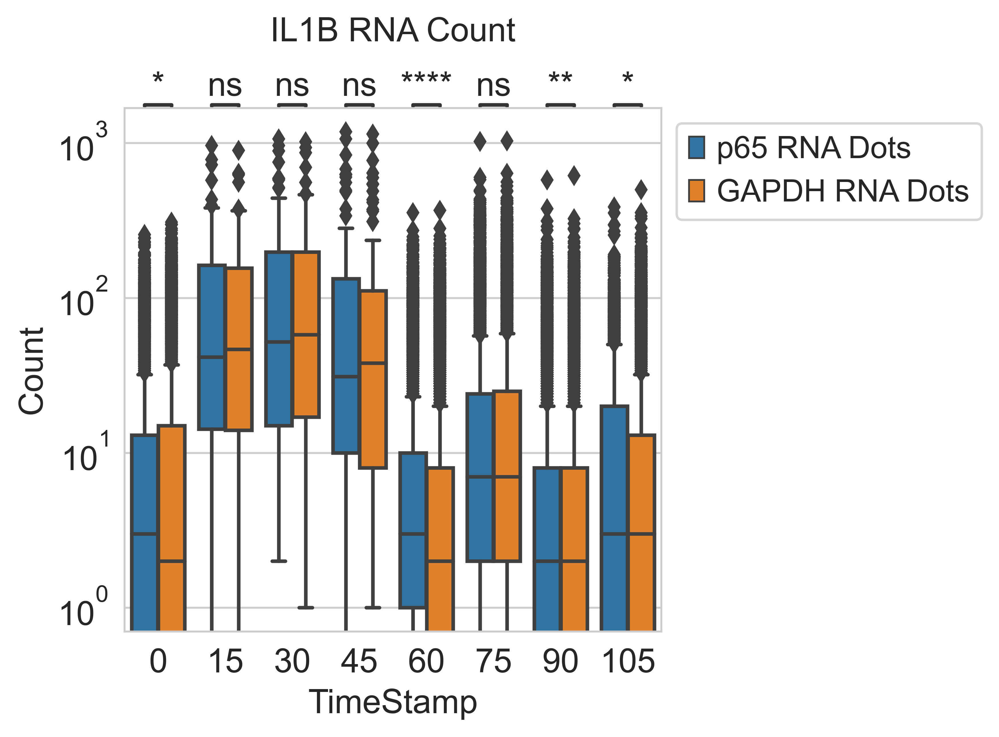

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

15_p65 RNA Dots v.s. 15_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.156e+03
0_p65 RNA Dots v.s. 0_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.427e-19 U_stat=3.369e+07
30_p65 RNA Dots v.s. 30_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.438e+03
45_p65 RNA Dots v.s. 45_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.847e-05 U_stat=3.990e+06
60_p65 RNA Dots v.s. 60_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.204e-09 U_stat=2.875e+07
75_p65 RNA Dots v.s. 75_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.357e-06 U_stat=1.884e+07
90_p65 RNA

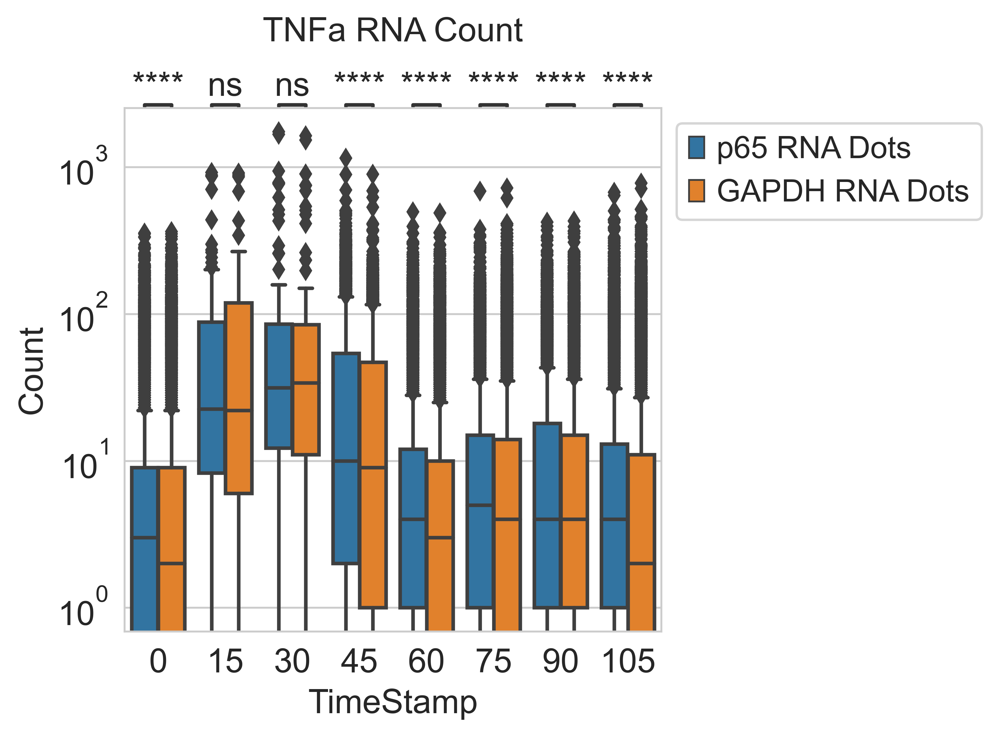

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

15_p65 RNA Dots v.s. 15_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.280e+02
0_p65 RNA Dots v.s. 0_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.026e-26 U_stat=1.600e+07
30_p65 RNA Dots v.s. 30_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.746e+04
45_p65 RNA Dots v.s. 45_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.303e-01 U_stat=6.529e+04
60_p65 RNA Dots v.s. 60_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.832e-10 U_stat=2.460e+07
75_p65 RNA Dots v.s. 75_GAPDH RNA Dots: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.520e-05 U_stat=4.762e+06
90_p65 RNA

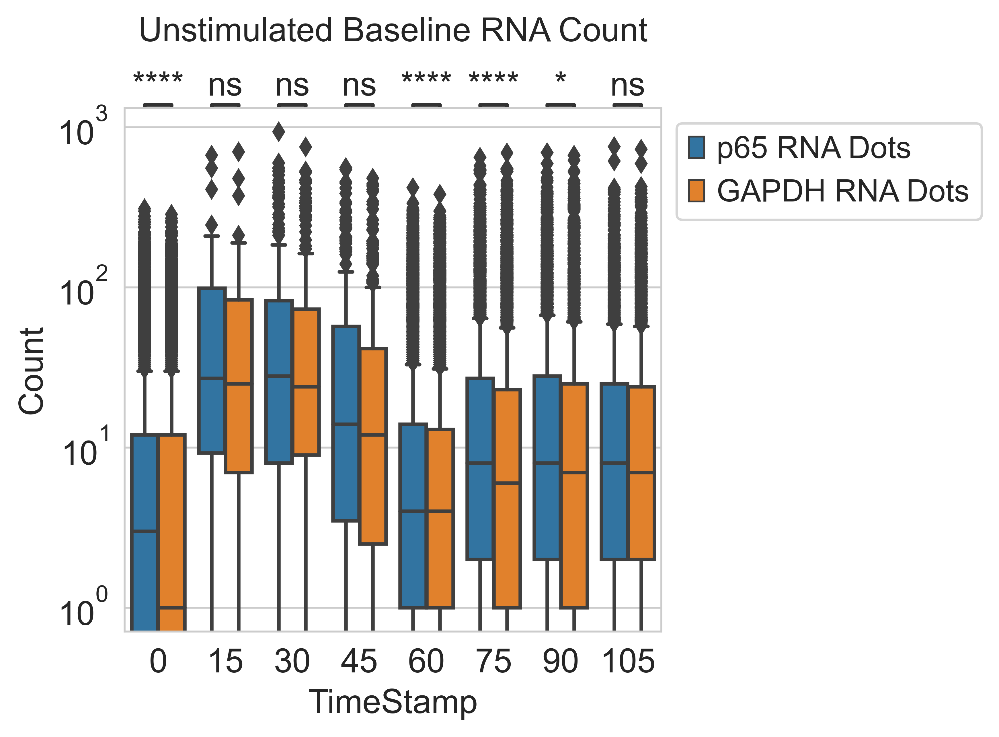

In [15]:
x = 'TimeStamp'
y = 'Count'
hue = 'RNA'

for ii, drug in enumerate(dfSub['Drug'].unique()): # each drug

    dfDrug = dfSub.loc[dfSub['Drug'] == drug]

    fig, ax = plt.subplots(dpi = 300)
    ax.set_ylabel('RNA Count')
    ax.set_yscale('log')
    ax.set_title(drug + ' RNA Count', y = 1.1)

    # boxplot 
    sns.boxplot(data = dfDrug, x = x, y = y, hue = hue, ax = ax)

    # add stats comparison
    boxPairs = [((t, 'p65 RNA Dots'), (t, 'GAPDH RNA Dots')) for t in dfDrug[x].unique()]
    add_stat_annotation(ax = ax, data = dfDrug, x = x, y = y, hue = hue, box_pairs = boxPairs, 
                        test = 'Mann-Whitney', text_format = 'star', loc = 'outside', verbose = 2)

    ax.legend(bbox_to_anchor = [1, 1], loc = 'upper left')

    saveFigLabelTime(fig, title=drug + '_RNA_Count')
    plt.show()

# Boxplot p65 and GAPDH RNA intensities

In [16]:
dfSub = dfCell.groupby(['Drug', 'TimeStamp', 'FOV', 'CellLabel']).sum()
dfSub.reset_index(drop = False, inplace = True)
# dfSub.drop(columns = [*idCols, 'NucCytoRatio'], inplace = True, errors = 'ignore')# reformat
# collect RNA columns
cols = [c for c in dfSub.columns if 'RNA' in c and \
        'Intensity' in c]
dfSub = dfSub.melt(id_vars = ['Drug', 'TimeStamp', 'FOV', 'CellLabel'], 
                   value_vars=cols,
                   var_name = 'RNA', value_name = 'Intensity')
# dfSub['RNA'] = dfSub['RNA'].str.replace(' RNA', '')
dfSub

C:\Users\nzhang326\AppData\Local\Temp\ipykernel_15476\822882554.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  dfSub = dfCell.groupby(['Drug', 'TimeStamp', 'FOV', 'CellLabel']).sum()


,Drug,TimeStamp,FOV,CellLabel,RNA,Intensity
0,IL1B,0,189,23763,p65 RNA Intensity,6386577.0
1,IL1B,0,189,23764,p65 RNA Intensity,643910.0
2,IL1B,0,189,23779,p65 RNA Intensity,14206781.0
3,IL1B,0,189,23780,p65 RNA Intensity,11555296.0
4,IL1B,0,189,23781,p65 RNA Intensity,26844940.0
...,...,...,...,...,...,...
179333,Unstimulated Baseline,105,480,61882,GAPDH RNA Intensity,552950.0
179334,Unstimulated Baseline,105,480,61884,GAPDH RNA Intensity,571727.0
179335,Unstimulated Baseline,105,480,61897,GAPDH RNA Intensity,249330.0
179336,Unstimulated Baseline,105,480,61902,GAPDH RNA Intensity,1100064.0


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

15_p65 RNA Intensity v.s. 15_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.017e+03
0_p65 RNA Intensity v.s. 0_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.067e-47 U_stat=1.744e+07
30_p65 RNA Intensity v.s. 30_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.457e+03
45_p65 RNA Intensity v.s. 45_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.131e+03
60_p65 RNA Intensity v.s. 60_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.966e+07
75_p65 RNA Intensity v.s. 75_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonfer

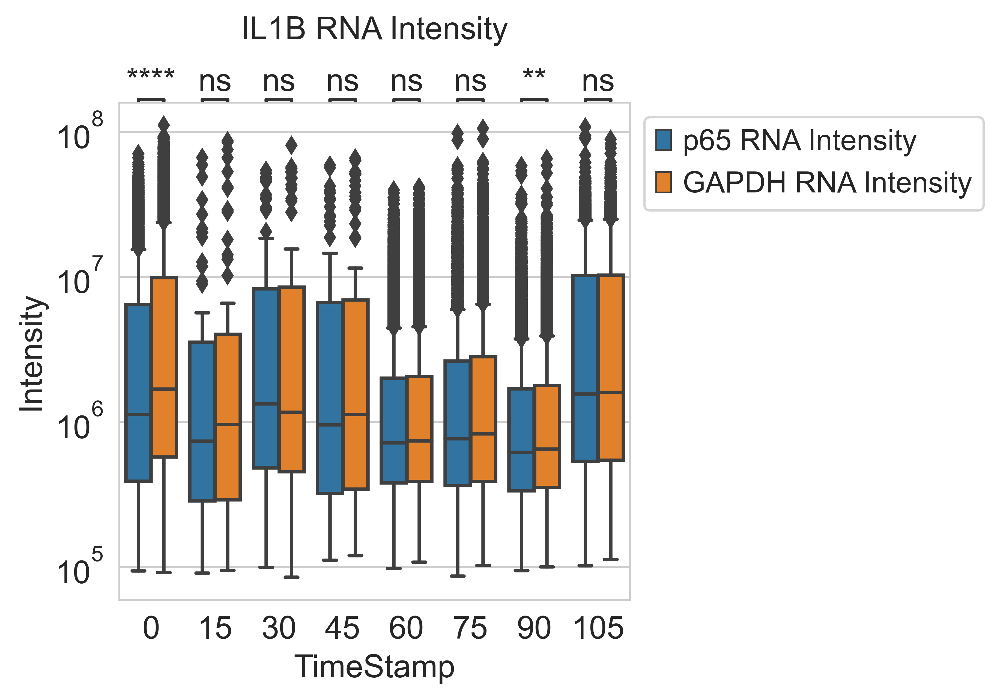

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

15_p65 RNA Intensity v.s. 15_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.141e+03
0_p65 RNA Intensity v.s. 0_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.624e-54 U_stat=2.662e+07
30_p65 RNA Intensity v.s. 30_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.352e+03
45_p65 RNA Intensity v.s. 45_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.300e-34 U_stat=3.012e+06
60_p65 RNA Intensity v.s. 60_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.727e-13 U_stat=2.524e+07
75_p65 RNA Intensity v.s. 75_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonfer

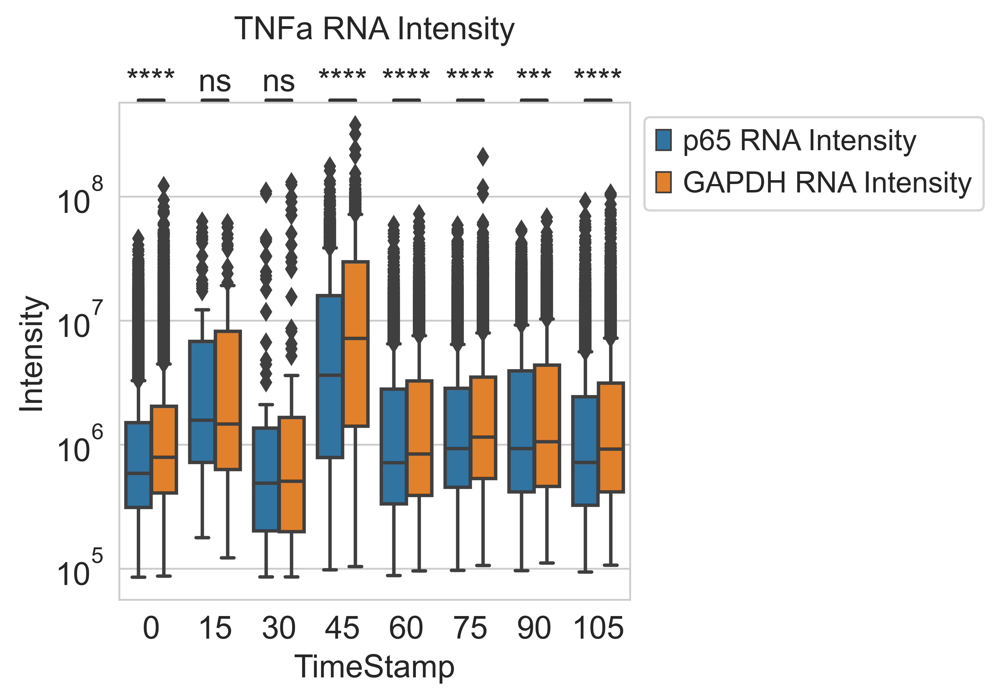

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

15_p65 RNA Intensity v.s. 15_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.934e-01 U_stat=6.900e+02
0_p65 RNA Intensity v.s. 0_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.419e-236 U_stat=9.061e+06
30_p65 RNA Intensity v.s. 30_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.120e-03 U_stat=1.321e+04
45_p65 RNA Intensity v.s. 45_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.270e-01 U_stat=5.480e+04
60_p65 RNA Intensity v.s. 60_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.222e-12 U_stat=2.145e+07
75_p65 RNA Intensity v.s. 75_GAPDH RNA Intensity: Mann-Whitney-Wilcoxon test two-sided with Bonfe

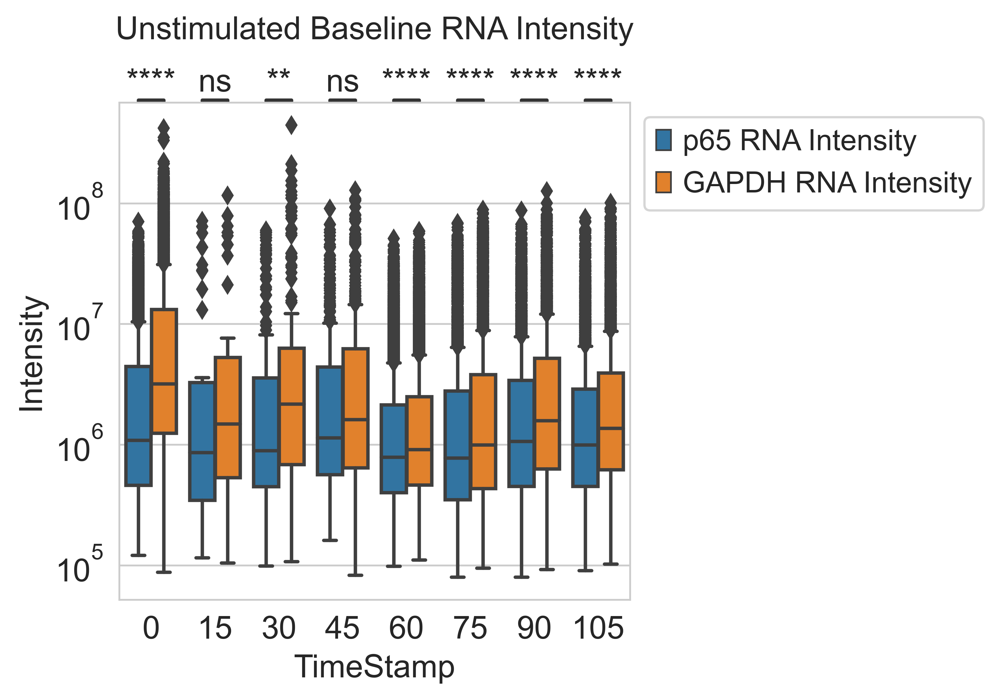

In [17]:
x = 'TimeStamp'
y = 'Intensity'
hue = 'RNA'

for ii, drug in enumerate(dfSub['Drug'].unique()): # each drug

    dfDrug = dfSub.loc[dfSub['Drug'] == drug]

    fig, ax = plt.subplots(dpi = 300)
    ax.set_ylabel('RNA Intensity (AU)')
    ax.set_yscale('log')
    ax.set_title(drug + ' RNA Intensity', y = 1.1)

    # boxplot 
    sns.boxplot(data = dfDrug, x = x, y = y, hue = hue, ax = ax)

    # add stats comparison
    boxPairs = [((t, 'p65 RNA Intensity'), (t, 'GAPDH RNA Intensity')) for t in dfDrug[x].unique()]
    add_stat_annotation(ax = ax, data = dfDrug, x = x, y = y, hue = hue, box_pairs = boxPairs, 
                        test = 'Mann-Whitney', text_format = 'star', loc = 'outside', verbose = 2)

    ax.legend(bbox_to_anchor = [1, 1], loc = 'upper left')

    saveFigLabelTime(fig, title=drug + '_RNA_Intensity')
    plt.show()